In [ ]:
'''
计算各方法在50个真实数据集或相关的合成数据集上的所有指标的均值并绘制柱状图
'''

In [2]:
import pandas as pd
from sklearn.preprocessing import MinMaxScaler
from functools import reduce
import os
import re

### 真实数据集--聚类指标均值与柱状图

In [26]:
fragments = ['scDesign3','TI','SIMLR','VASC','benchmarker']
matched_paths = []
for fragment in fragments:
    folder_path = f'/home/henu/work/result/cluster/{fragment}/'
    # 定义正则表达式匹配文件名
    pattern = re.compile(r'spectral_HOMO\.csv$')

    # 遍历文件夹下的所有文件
    for root, dirs, files in os.walk(folder_path):
        for file in files:
            if pattern.match(file):
                # 获取文件的完整路径
                file_path = os.path.join(root, file)
                print(file_path)
                matched_paths.append(file_path)
print(len(matched_paths))

all_dfs = pd.DataFrame()
for file_path in matched_paths:
    df = pd.read_csv(file_path)
    all_dfs = pd.concat([all_dfs, df], ignore_index=True)

# print(all_dfs)
# 对每种方法的指标求均值
mean_values = all_dfs.groupby('Method').mean().reset_index()
# print(mean_value)
# 保存结果到一个新的 CSV 文件中
mean_values.to_csv('/home/henu/work/result/score/cluster/spectral/HOMO.csv', index=False)

/home/henu/work/result/cluster/scDesign3/MARROW/indicators/spectral_HOMO.csv
/home/henu/work/result/cluster/scDesign3/PANCREAS/indicators/spectral_HOMO.csv
/home/henu/work/result/cluster/scDesign3/SLIDE/indicators/spectral_HOMO.csv
/home/henu/work/result/cluster/scDesign3/IFNB/indicators/spectral_HOMO.csv
/home/henu/work/result/cluster/scDesign3/CITE/indicators/spectral_HOMO.csv
/home/henu/work/result/cluster/scDesign3/SCGEMRNA/indicators/spectral_HOMO.csv
/home/henu/work/result/cluster/scDesign3/SCGEMMETH/indicators/spectral_HOMO.csv
/home/henu/work/result/cluster/scDesign3/MOBSC/indicators/spectral_HOMO.csv
/home/henu/work/result/cluster/scDesign3/VISIUM/indicators/spectral_HOMO.csv
/home/henu/work/result/cluster/scDesign3/SCIATAC/indicators/spectral_HOMO.csv
/home/henu/work/result/cluster/scDesign3/BATCH/indicators/spectral_HOMO.csv
/home/henu/work/result/cluster/scDesign3/ATAC/indicators/spectral_HOMO.csv
/home/henu/work/result/cluster/scDesign3/OVARIAN/indicators/spectral_HOMO.csv

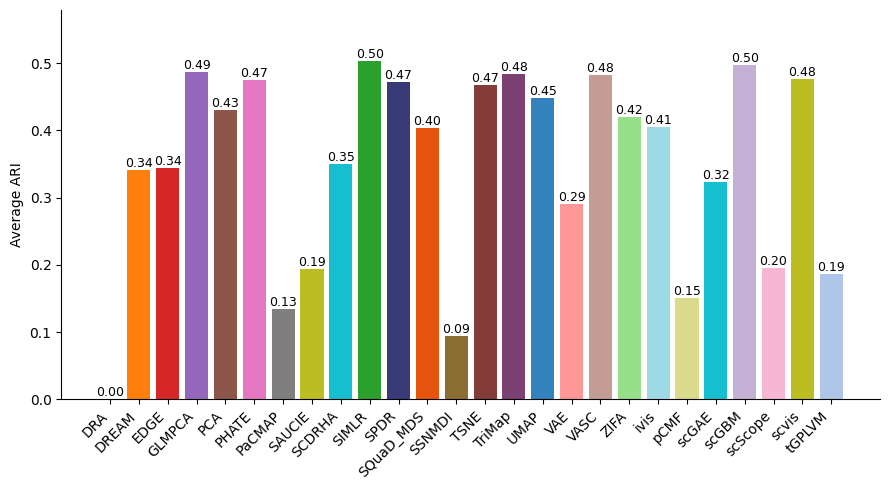

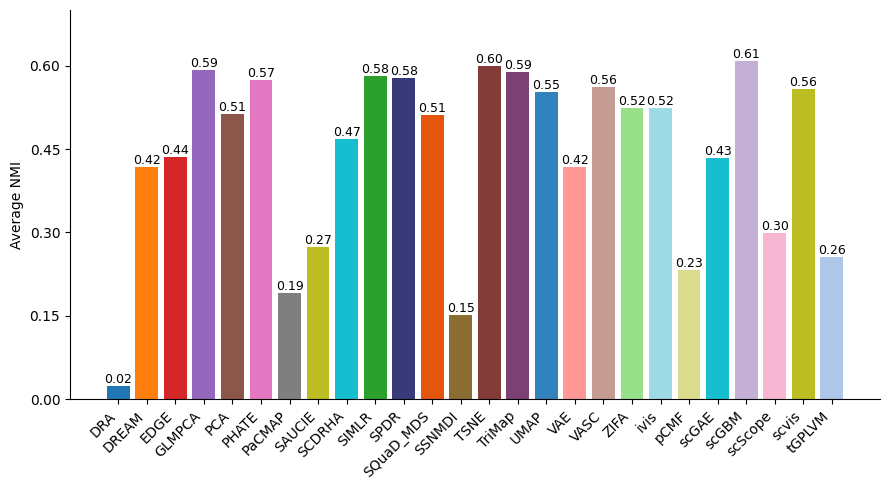

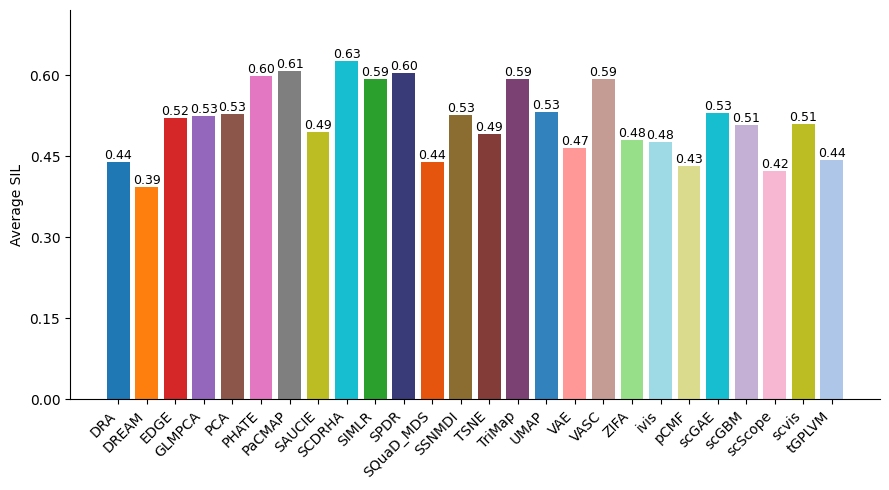

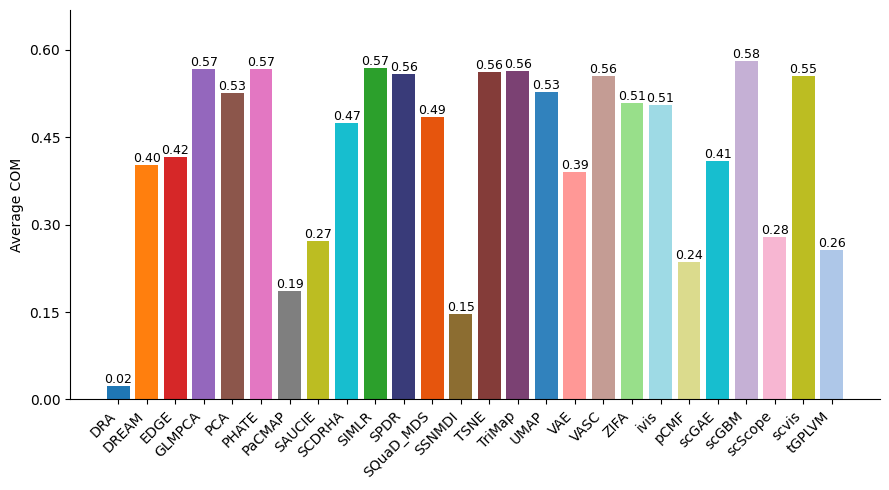

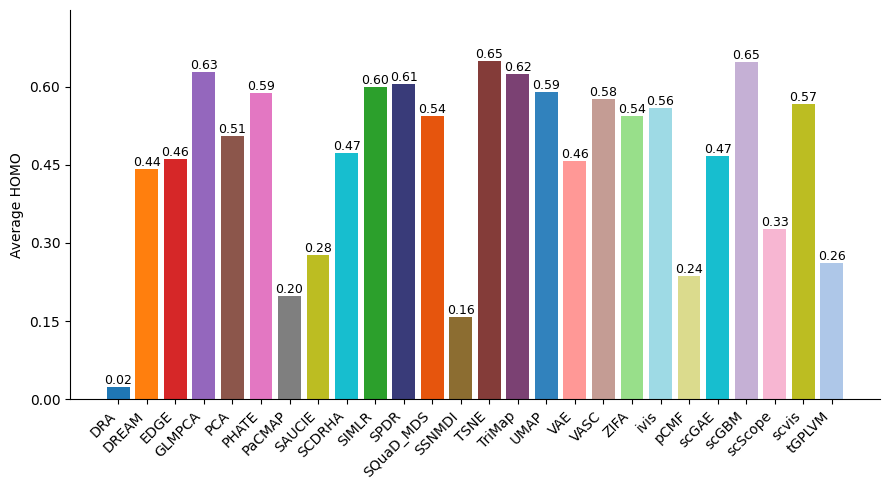

...

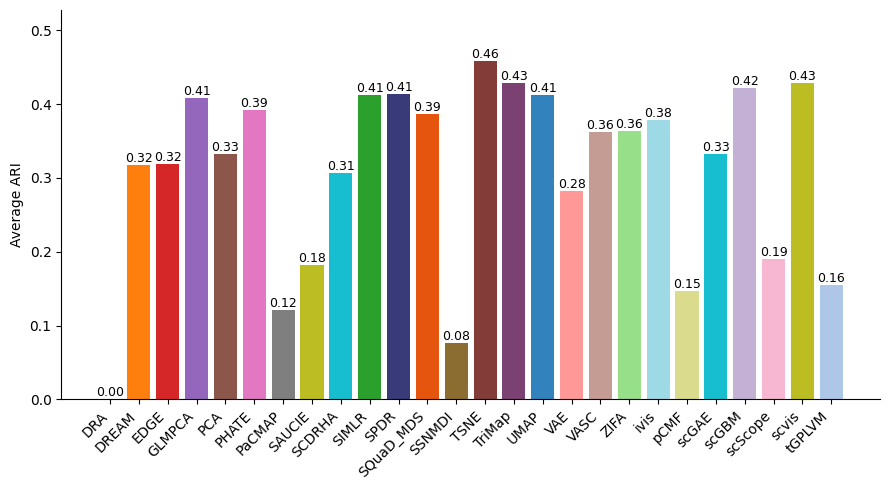

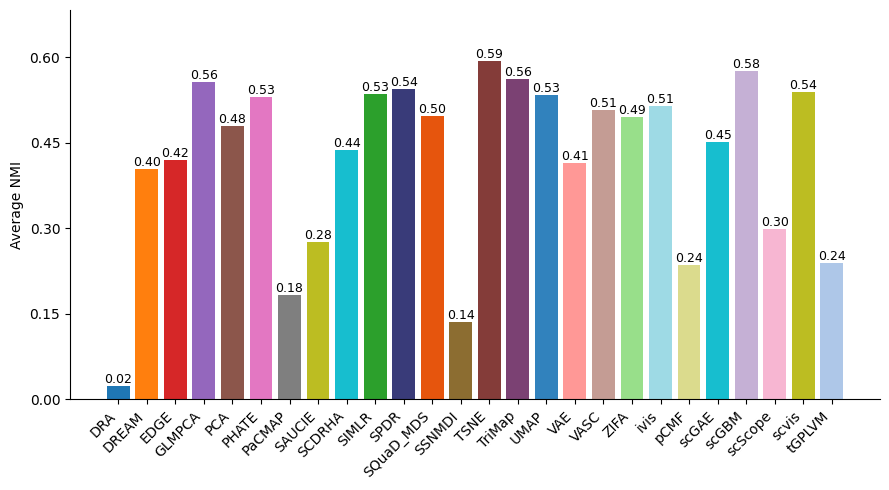

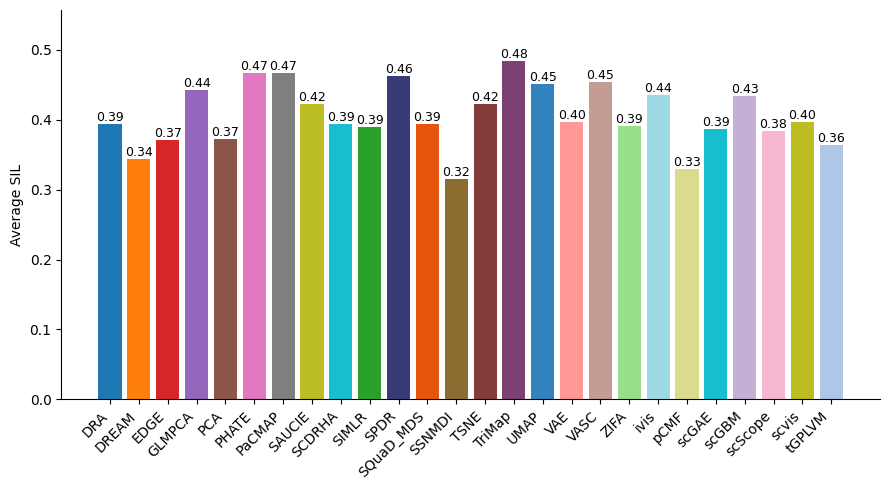

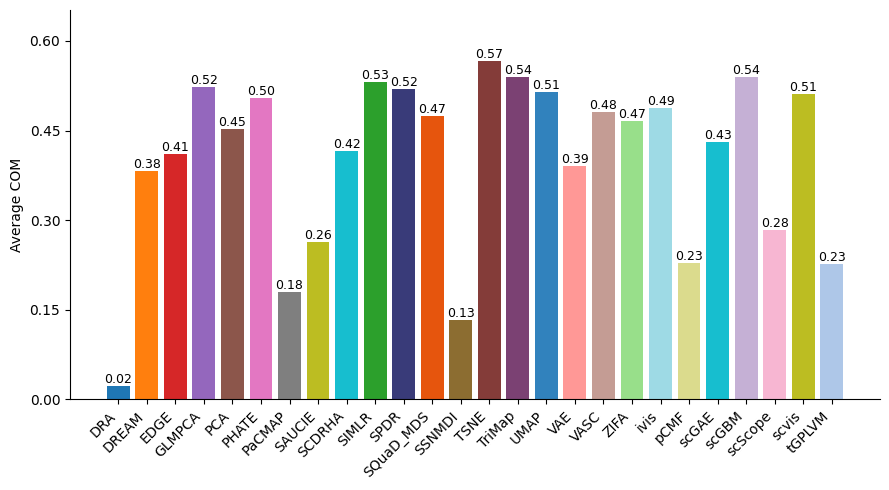

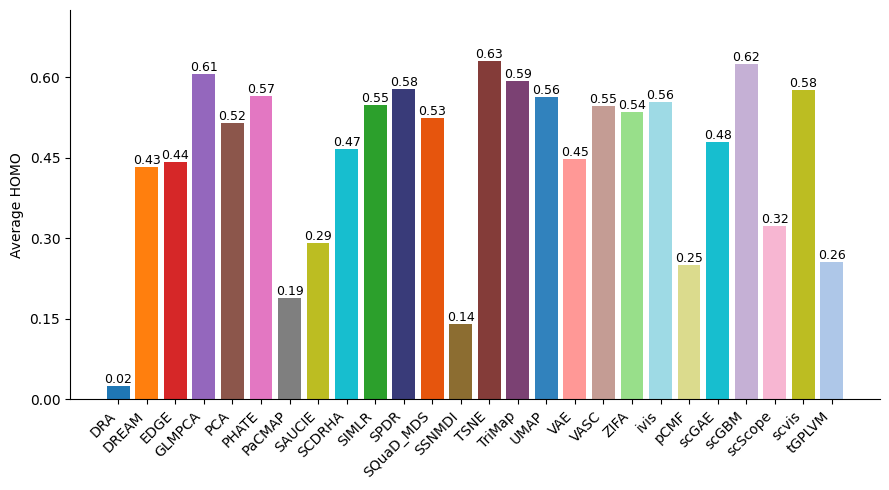

In [3]:
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.ticker import MaxNLocator

# 定义颜色列表
colors = [
    "#1f77b4", "#ff7f0e", "#d62728", "#9467bd", "#8c564b", "#e377c2",
    "#7f7f7f", "#bcbd22", "#17becf", "#2ca02c",
    "#393b79", "#e6550d", "#8c6d31", "#843c39", "#7b4173",
    "#3182bd", "#ff9896", "#c49c94", "#98df8a", "#9edae5",
    "#dbdb8d", "#17becf", "#c5b0d5", "#f7b6d2", "#bcbd22", "#aec7e8"
]

fragment1 = ['kmeans','louvain','spectral']
fragment2 = ['ARI','NMI','SIL','COM','HOMO']
for fra1 in fragment1:
    for fra2 in fragment2:
        # 读取结果
        csv_path = f"/home/henu/work/result/score/cluster/{fra1}/{fra2}.csv"
        metric = f"{fra2}"

        df = pd.read_csv(csv_path)

        # 兼容：若第二列不是 NMI，就自动使用第二列为指标列
        if metric not in df.columns and len(df.columns) >= 2:
            metric = df.columns[1]

        # 去掉 UMAP 方法
        df = df[df["Method"] != "ParametricUMAP200"].copy()
        df = df[df["Method"] != "ParametricUMAP50"].copy()
        df = df[df["Method"] != "SQuaD_MDS"].copy()

        # 将 SQuaD_MDS_hybrid 的名字改为 SQuaD_MDS
        df['Method'] = df['Method'].replace({'SQuaD_MDS_hybrid': 'SQuaD_MDS'})

        # 不按大小排序，保持原始文件顺序
        df = df[["Method", metric]].copy()

        # 画图
        plt.figure(figsize=(9, 5))  # 宽一点便于放下方法名
        bars = plt.bar(df["Method"], df[metric], color=colors[:len(df)])

        # y 轴范围给一点头部空间以便数值标注
        ymax = df[metric].max() if len(df) else 1.0
        plt.ylim(0, ymax * 1.15)

        # 轴标题与刻度
        # plt.xlabel("Method")
        plt.ylabel(f"Average {metric}")
        # plt.title(f"Average {metric} by Method")
        plt.gca().yaxis.set_major_locator(MaxNLocator(nbins=6))  # 让刻度更整齐

        # 隐藏上边和右边的边框线
        plt.gca().spines['top'].set_visible(False)
        plt.gca().spines['right'].set_visible(False)

        # x 轴标签旋转，避免重叠
        plt.xticks(rotation=45, ha="right")

        # 在柱顶标注数值（保留2位小数）
        for rect, val in zip(bars, df[metric].values):
            height = rect.get_height()
            plt.text(
                rect.get_x() + rect.get_width() / 2,
                height,
                f"{val:.2f}",
                ha="center",
                va="bottom",
                fontsize=9
            )

        plt.tight_layout()

        # 保存图片
        out_svg = f"/home/henu/work/result/figures/cluster/{fra1}/{fra2}.svg"
        plt.savefig(out_svg)
        plt.show()

### 真实数据集--结构保留指标均值与柱状图

In [41]:
fragments = ['scDesign3','TI','SIMLR','VASC','benchmarker']
matched_paths = []
for fragment in fragments:
    folder_path = f'/home/henu/work/result/metric/{fragment}/'
    # 定义正则表达式匹配文件名
    pattern = re.compile(r'dr3\.csv$')

    # 遍历文件夹下的所有文件
    for root, dirs, files in os.walk(folder_path):
        for file in files:
            if pattern.match(file):
                # 获取文件的完整路径
                file_path = os.path.join(root, file)
                print(file_path)
                matched_paths.append(file_path)
print(len(matched_paths))

all_dfs = pd.DataFrame()
for file_path in matched_paths:
    df = pd.read_csv(file_path)
    all_dfs = pd.concat([all_dfs, df], ignore_index=True)

# print(all_dfs)
# 对每种方法的指标求均值
mean_values = all_dfs.groupby('Method').mean().reset_index()
print(mean_values)
# # 保存结果到一个新的 CSV 文件中
mean_values.to_csv('/home/henu/work/result/score/dr3.csv', index=False)

/home/henu/work/result/metric/scDesign3/MARROW/dr3.csv
/home/henu/work/result/metric/scDesign3/PANCREAS/dr3.csv
/home/henu/work/result/metric/scDesign3/SLIDE/dr3.csv
/home/henu/work/result/metric/scDesign3/IFNB/dr3.csv
/home/henu/work/result/metric/scDesign3/CITE/dr3.csv
/home/henu/work/result/metric/scDesign3/SCGEMRNA/dr3.csv
/home/henu/work/result/metric/scDesign3/SCGEMMETH/dr3.csv
/home/henu/work/result/metric/scDesign3/MOBSC/dr3.csv
/home/henu/work/result/metric/scDesign3/VISIUM/dr3.csv
/home/henu/work/result/metric/scDesign3/SCIATAC/dr3.csv
/home/henu/work/result/metric/scDesign3/BATCH/dr3.csv
/home/henu/work/result/metric/scDesign3/ATAC/dr3.csv
/home/henu/work/result/metric/scDesign3/OVARIAN/dr3.csv
/home/henu/work/result/metric/scDesign3/EMBYRO/dr3.csv
/home/henu/work/result/metric/scDesign3/ACINAR/dr3.csv
/home/henu/work/result/metric/TI/parenchyme/dr3.csv
/home/henu/work/result/metric/TI/combination-1/dr3.csv
/home/henu/work/result/metric/TI/DA1_horns/dr3.csv
/home/henu/work/r

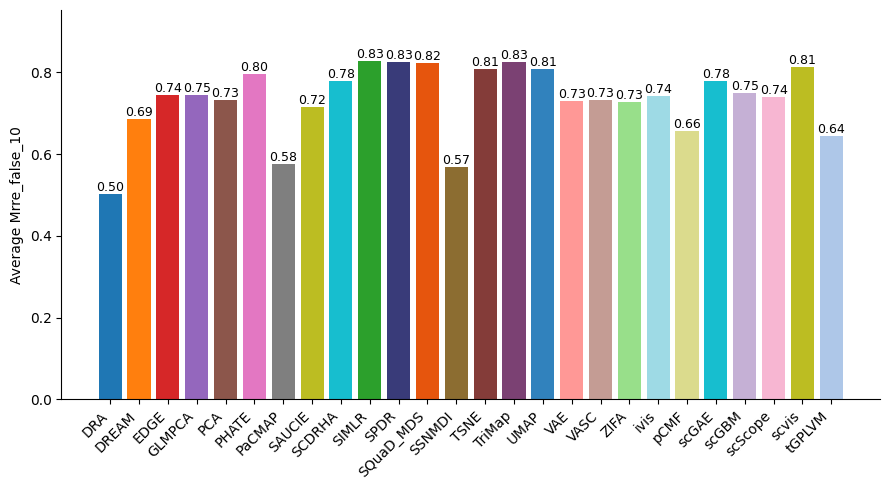

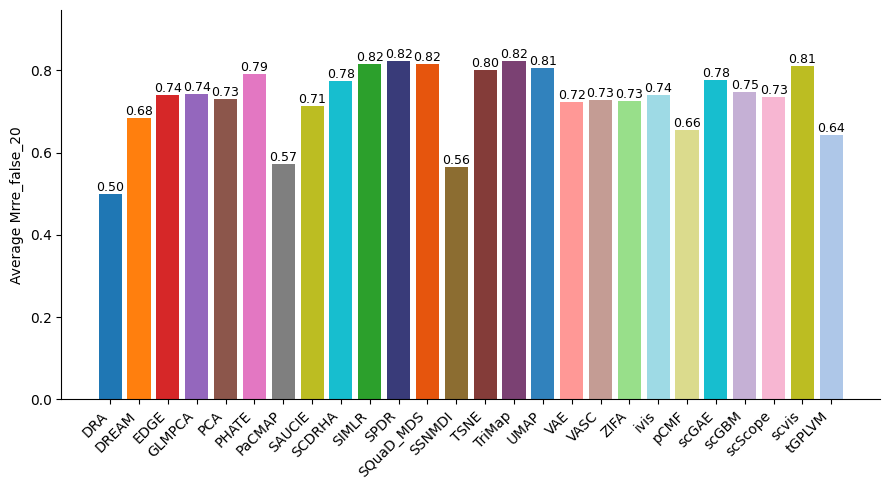

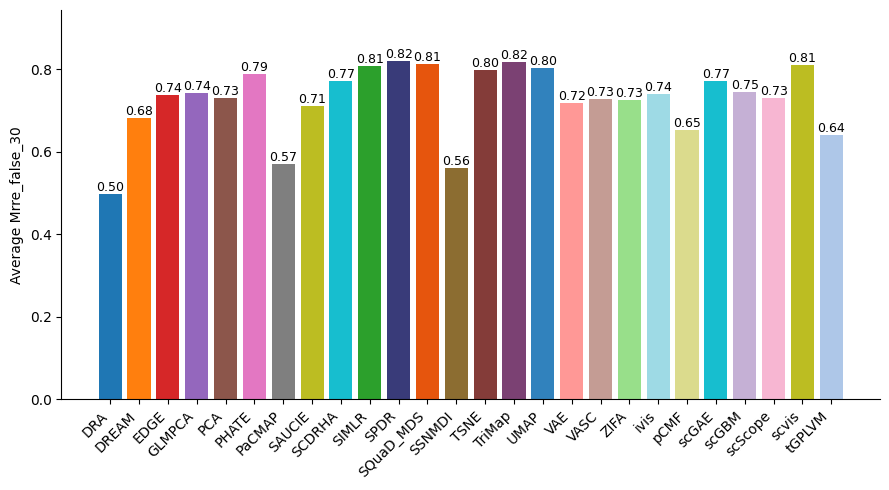

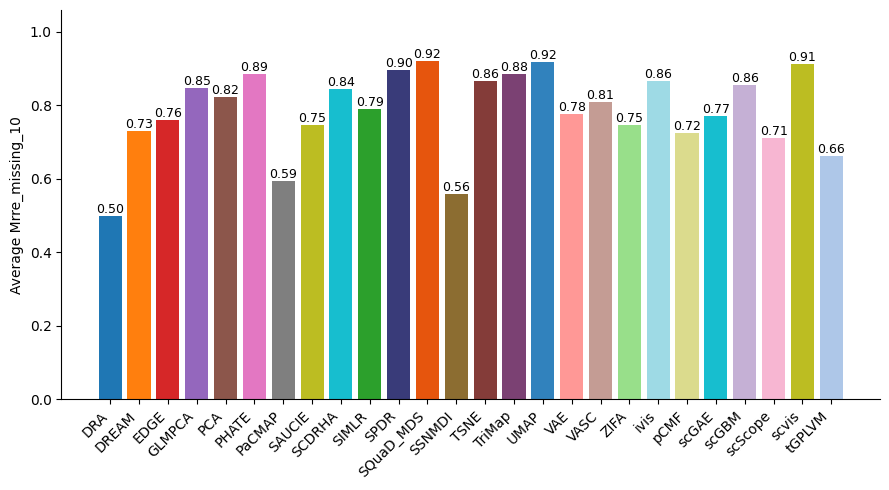

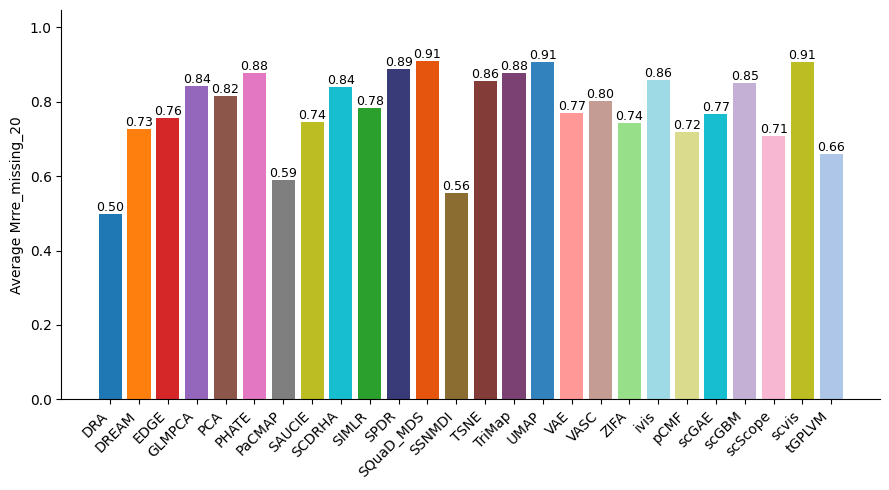

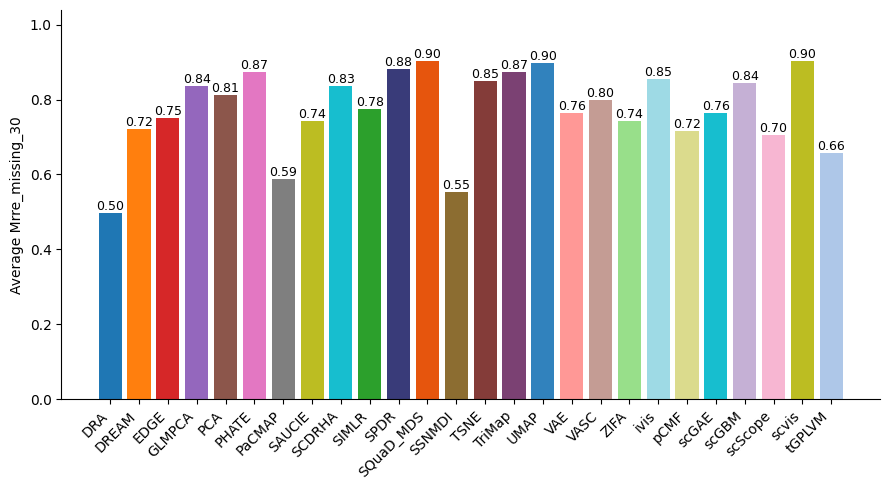

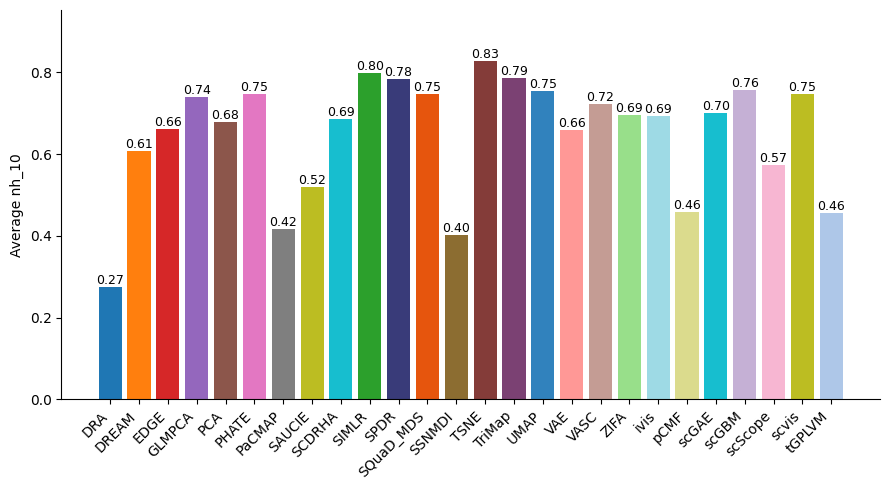

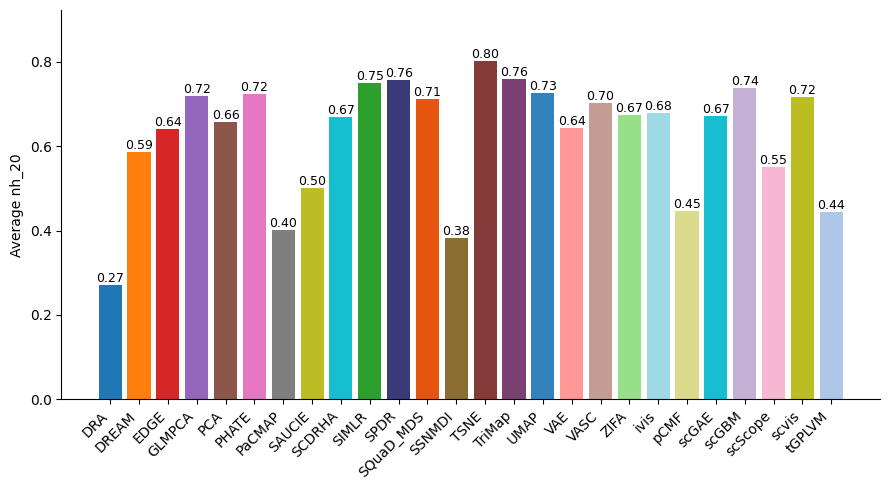

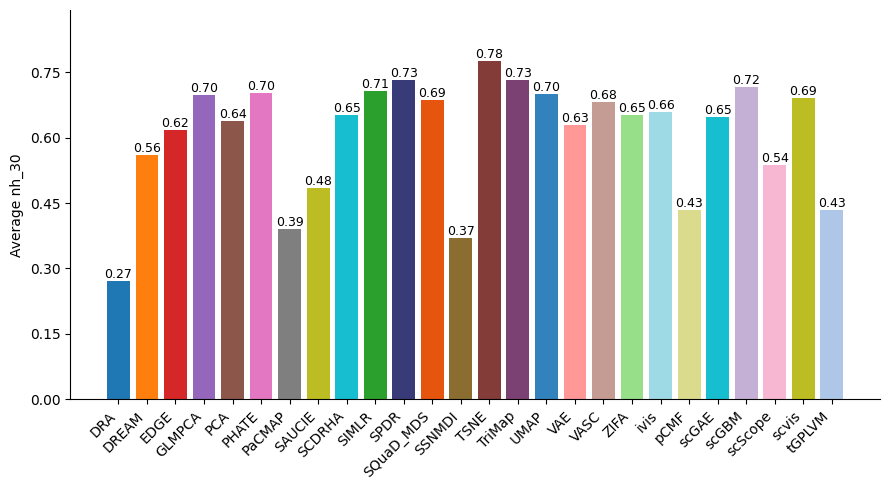

In [8]:
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.ticker import MaxNLocator

# 定义颜色列表
colors = [
    "#1f77b4", "#ff7f0e", "#d62728", "#9467bd", "#8c564b", "#e377c2",
    "#7f7f7f", "#bcbd22", "#17becf", "#2ca02c",
    "#393b79", "#e6550d", "#8c6d31", "#843c39", "#7b4173",
    "#3182bd", "#ff9896", "#c49c94", "#98df8a", "#9edae5",
    "#dbdb8d", "#17becf", "#c5b0d5", "#f7b6d2", "#bcbd22", "#aec7e8"
]

dr1_local = ['knn_10','knn_20','knn_30','svm','nkr_10','nkr_20','nkr_30','aji_10','aji_20','aji_30']
dr1_global = ['random_triplet','spearman','k-nearest','centroid_distance']
dr2_local = ['T_10','T_20','T_30','C_10','C_20','C_30']
dr3_local = ['Mrre_false_10','Mrre_false_20','Mrre_false_30','Mrre_missing_10','Mrre_missing_20','Mrre_missing_30','nh_10','nh_20','nh_30']
dr3_global = ['Pearson']

for dr1 in dr3_local:
    csv_path = f"/home/henu/work/result/score/dr3.csv"
    metric = f"{dr1}"

    df = pd.read_csv(csv_path)

    # # 兼容：若第二列不是 NMI，就自动使用第二列为指标列
    # if metric not in df.columns and len(df.columns) >= 2:
    #     metric = df.columns[1]

    # 去掉 UMAP 方法
    df = df[df["Method"] != "ParametricUMAP200"].copy()
    df = df[df["Method"] != "ParametricUMAP50"].copy()
    df = df[df["Method"] != "SQuaD_MDS"].copy()

    # 将 SQuaD_MDS_hybrid 的名字改为 SQuaD_MDS
    df['Method'] = df['Method'].replace({'SQuaD_MDS_hybrid': 'SQuaD_MDS'})

    # 不按大小排序，保持原始文件顺序
    df = df[["Method", metric]].copy()

    # 画图
    plt.figure(figsize=(9, 5))  # 宽一点便于放下方法名
    bars = plt.bar(df["Method"], df[metric], color=colors[:len(df)])

    # y 轴范围给一点头部空间以便数值标注
    ymax = df[metric].max() if len(df) else 1.0
    plt.ylim(0, ymax * 1.15)

    # 轴标题与刻度
    # plt.xlabel("Method")
    plt.ylabel(f"Average {metric}")
    # plt.title(f"Average {metric} by Method")
    plt.gca().yaxis.set_major_locator(MaxNLocator(nbins=6))  # 让刻度更整齐

    # 隐藏上边和右边的边框线
    plt.gca().spines['top'].set_visible(False)
    plt.gca().spines['right'].set_visible(False)

    # x 轴标签旋转，避免重叠
    plt.xticks(rotation=45, ha="right")

    # 在柱顶标注数值（保留2位小数）
    for rect, val in zip(bars, df[metric].values):
        height = rect.get_height()
        plt.text(
            rect.get_x() + rect.get_width() / 2,
            height,
            f"{val:.2f}",
            ha="center",
            va="bottom",
            fontsize=9
        )

    plt.tight_layout()

    # 保存图片
    out_svg = f"/home/henu/work/result/figures/local/{dr1}.svg"
    plt.savefig(out_svg)
    plt.show()

### 合成数据集--指标均值

In [6]:
datasets = ['cell_100','cell_500','cell_1k','cell_5k','cell_1w','cell_2w','cell_3w']
matched_paths = []

for dataset in datasets:
    folder_path = f'/home/henu/work/result/cluster/simulate/{dataset}/'
    # 定义正则表达式匹配文件名
    pattern = re.compile(r'kmeans_ARI\.csv$')

    # 遍历文件夹下的所有文件
    for root, dirs, files in os.walk(folder_path):
        for file in files:
            if pattern.match(file):
                # 获取文件的完整路径
                file_path = os.path.join(root, file)
                print(file_path)
                matched_paths.append(file_path)
print(len(matched_paths))

all_dfs = pd.DataFrame()
for file_path in matched_paths:
    df = pd.read_csv(file_path)
    all_dfs = pd.concat([all_dfs, df], ignore_index=True)

# print(all_dfs)
# 对每种方法的指标求均值
mean_values = all_dfs.groupby('Method').mean().reset_index()
# print(mean_value)
# 保存结果到一个新的 CSV 文件中
mean_values.to_csv('/home/henu/work/result/score/synthetic/kmeans/ARI.csv', index=False)

/home/henu/work/result/cluster/simulate/cell_100/indicators/kmeans_ARI.csv
/home/henu/work/result/cluster/simulate/cell_500/indicators/kmeans_ARI.csv
/home/henu/work/result/cluster/simulate/cell_1k/indicators/kmeans_ARI.csv
/home/henu/work/result/cluster/simulate/cell_5k/indicators/kmeans_ARI.csv
/home/henu/work/result/cluster/simulate/cell_1w/indicators/kmeans_ARI.csv
/home/henu/work/result/cluster/simulate/cell_2w/indicators/kmeans_ARI.csv
/home/henu/work/result/cluster/simulate/cell_3w/indicators/kmeans_ARI.csv
7


In [16]:
fragments = ['cells','genes','celltypes','batchs','batch_strength','dropouts','des','de_strength','outs']

for fragment in fragments:
    matched_paths = []
    if fragment=='cells':
        datasets = ['cell_100','cell_500','cell_1k','cell_5k','cell_1w','cell_2w','cell_3w']
    elif fragment=='genes':
        datasets = ['gene_5k','gene_2w','gene_3w','gene_4w','gene_5w']
    elif fragment=='celltypes':
        datasets = ['celltype_7','celltype_9','celltype_11','celltype_13','celltype_15']
    elif fragment=='batchs':
        datasets = ['batch_2','batch_4','batch_6','batch_8','batch_10']
    elif fragment=='batch_strength':
        datasets = ['batch_0.2','batch_0.4','batch_0.6','batch_0.8','batch_1.0']
    elif fragment=='dropouts':
        datasets = ['dropout_-1','dropout_0','dropout_1','dropout_2','dropout_3']
    elif fragment=='des':
        datasets = ['de_prob_0.05','de_prob_0.15','de_prob_0.2','de_prob_0.25','de_prob_0.3']
    elif fragment=='de_strength':
        datasets = ['de_0.2','de_0.4','de_0.6','de_0.8','de_1.0']
    elif fragment=='outs':
        datasets = ['out_0.1','out_0.2','out_0.3','out_0.4','out_0.5']

    for dataset in datasets:
        folder_path = f'/home/henu/work/result/cluster/simulate/{dataset}/'
        # 定义正则表达式匹配文件名
        pattern = re.compile(r'kmeans_SIL\.csv$')

        # 遍历文件夹下的所有文件
        for root, dirs, files in os.walk(folder_path):
            for file in files:
                if pattern.match(file):
                    # 获取文件的完整路径
                    file_path = os.path.join(root, file)
                    print(file_path)
                    matched_paths.append(file_path)
    print(len(matched_paths))

    all_dfs = pd.DataFrame()
    for file_path in matched_paths:
        df = pd.read_csv(file_path)
        all_dfs = pd.concat([all_dfs, df], ignore_index=True)

    # print(all_dfs)
    # 对每种方法的指标求均值
    mean_values = all_dfs.groupby('Method').mean().reset_index()
    # print(mean_value)
    # 保存结果到一个新的 CSV 文件中
    mean_values.to_csv(f'/home/henu/work/result/score/synthetic/kmeans/SIL/{fragment}_SIL.csv', index=False)

/home/henu/work/result/cluster/simulate/cell_100/indicators/kmeans_SIL.csv
/home/henu/work/result/cluster/simulate/cell_500/indicators/kmeans_SIL.csv
/home/henu/work/result/cluster/simulate/cell_1k/indicators/kmeans_SIL.csv
/home/henu/work/result/cluster/simulate/cell_5k/indicators/kmeans_SIL.csv
/home/henu/work/result/cluster/simulate/cell_1w/indicators/kmeans_SIL.csv
/home/henu/work/result/cluster/simulate/cell_2w/indicators/kmeans_SIL.csv
/home/henu/work/result/cluster/simulate/cell_3w/indicators/kmeans_SIL.csv
7
/home/henu/work/result/cluster/simulate/gene_5k/indicators/kmeans_SIL.csv
/home/henu/work/result/cluster/simulate/gene_2w/indicators/kmeans_SIL.csv
/home/henu/work/result/cluster/simulate/gene_3w/indicators/kmeans_SIL.csv
/home/henu/work/result/cluster/simulate/gene_4w/indicators/kmeans_SIL.csv
/home/henu/work/result/cluster/simulate/gene_5w/indicators/kmeans_SIL.csv
5
/home/henu/work/result/cluster/simulate/celltype_7/indicators/kmeans_SIL.csv
/home/henu/work/result/cluste

In [19]:
fragments = ['cells','genes','celltypes','batchs','batch_strength','dropouts','des','de_strength','outs']

for fragment in fragments:
    matched_paths = []
    if fragment=='cells':
        datasets = ['cell_100','cell_500','cell_1k','cell_5k','cell_1w','cell_2w','cell_3w']
    elif fragment=='genes':
        datasets = ['gene_5k','gene_2w','gene_3w','gene_4w','gene_5w']
    elif fragment=='celltypes':
        datasets = ['celltype_7','celltype_9','celltype_11','celltype_13','celltype_15']
    elif fragment=='batchs':
        datasets = ['batch_2','batch_4','batch_6','batch_8','batch_10']
    elif fragment=='batch_strength':
        datasets = ['batch_0.2','batch_0.4','batch_0.6','batch_0.8','batch_1.0']
    elif fragment=='dropouts':
        datasets = ['dropout_-1','dropout_0','dropout_1','dropout_2','dropout_3']
    elif fragment=='des':
        datasets = ['de_prob_0.05','de_prob_0.15','de_prob_0.2','de_prob_0.25','de_prob_0.3']
    elif fragment=='de_strength':
        datasets = ['de_0.2','de_0.4','de_0.6','de_0.8','de_1.0']
    elif fragment=='outs':
        datasets = ['out_0.1','out_0.2','out_0.3','out_0.4','out_0.5']

    for dataset in datasets:
        folder_path = f'/home/henu/work/result/metric/simulate/{dataset}/'
        # 定义正则表达式匹配文件名
        pattern = re.compile(r'dr3\.csv$')

        # 遍历文件夹下的所有文件
        for root, dirs, files in os.walk(folder_path):
            for file in files:
                if pattern.match(file):
                    # 获取文件的完整路径
                    file_path = os.path.join(root, file)
                    print(file_path)
                    matched_paths.append(file_path)
    print(len(matched_paths))

    all_dfs = pd.DataFrame()
    for file_path in matched_paths:
        df = pd.read_csv(file_path)
        all_dfs = pd.concat([all_dfs, df], ignore_index=True)

    # print(all_dfs)
    # 对每种方法的指标求均值
    mean_values = all_dfs.groupby('Method').mean().reset_index()
    # print(mean_value)
    # 保存结果到一个新的 CSV 文件中
    mean_values.to_csv(f'/home/henu/work/result/score/synthetic/local/{fragment}_dr3.csv', index=False)

/home/henu/work/result/metric/simulate/cell_100/dr3.csv
/home/henu/work/result/metric/simulate/cell_500/dr3.csv
/home/henu/work/result/metric/simulate/cell_1k/dr3.csv
/home/henu/work/result/metric/simulate/cell_5k/dr3.csv
/home/henu/work/result/metric/simulate/cell_1w/dr3.csv
/home/henu/work/result/metric/simulate/cell_2w/dr3.csv
/home/henu/work/result/metric/simulate/cell_3w/dr3.csv
7
/home/henu/work/result/metric/simulate/gene_5k/dr3.csv
/home/henu/work/result/metric/simulate/gene_2w/dr3.csv
/home/henu/work/result/metric/simulate/gene_3w/dr3.csv
/home/henu/work/result/metric/simulate/gene_4w/dr3.csv
/home/henu/work/result/metric/simulate/gene_5w/dr3.csv
5
/home/henu/work/result/metric/simulate/celltype_7/dr3.csv
/home/henu/work/result/metric/simulate/celltype_9/dr3.csv
/home/henu/work/result/metric/simulate/celltype_11/dr3.csv
/home/henu/work/result/metric/simulate/celltype_13/dr3.csv
/home/henu/work/result/metric/simulate/celltype_15/dr3.csv
5
/home/henu/work/result/metric/simulate/

### 合成数据集--结构保留均值柱状图

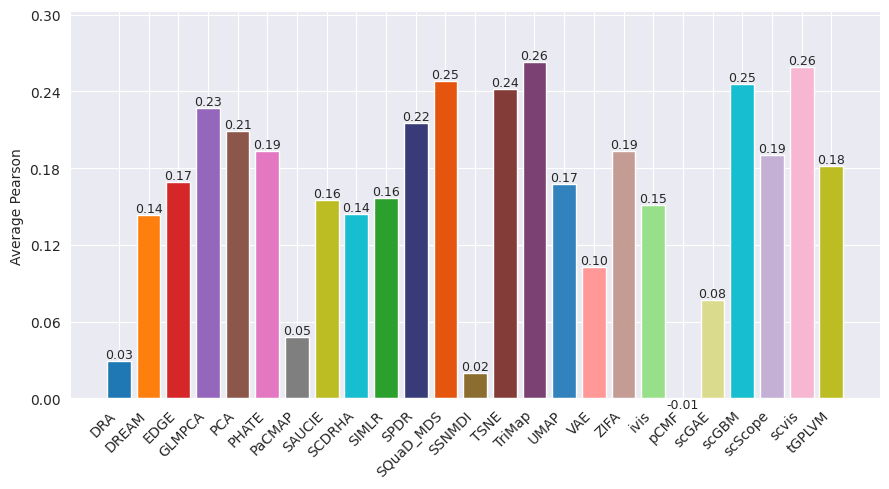

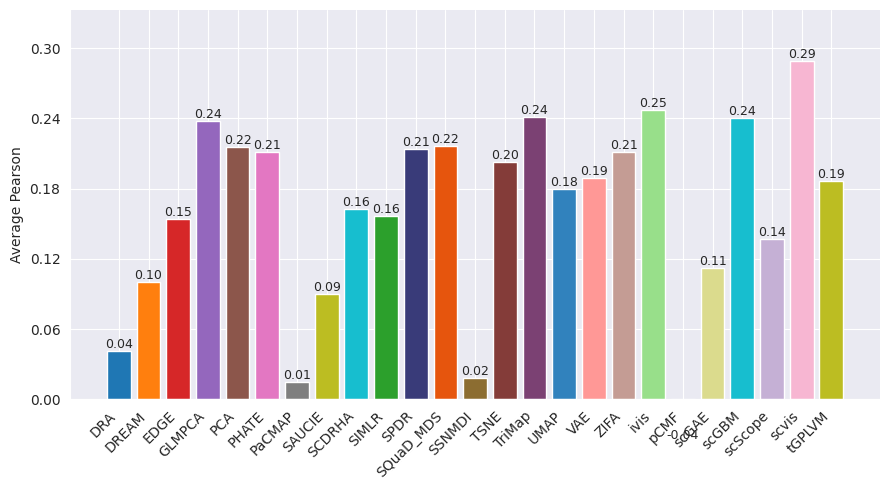

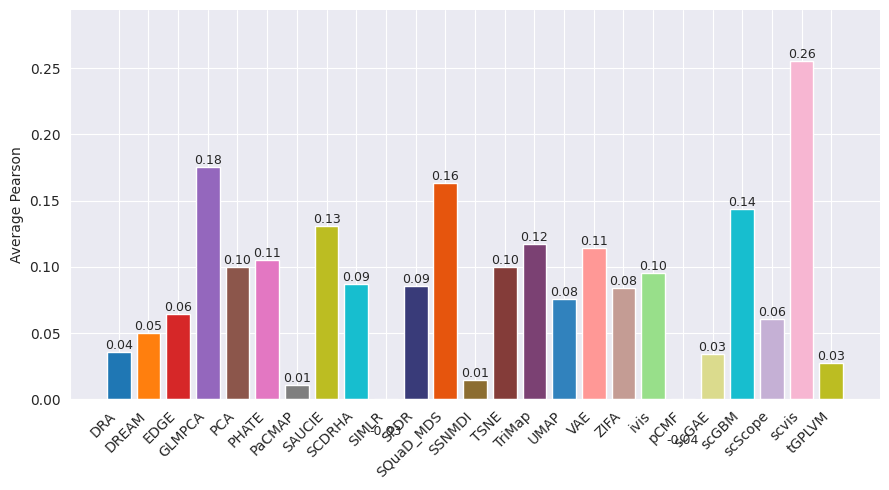

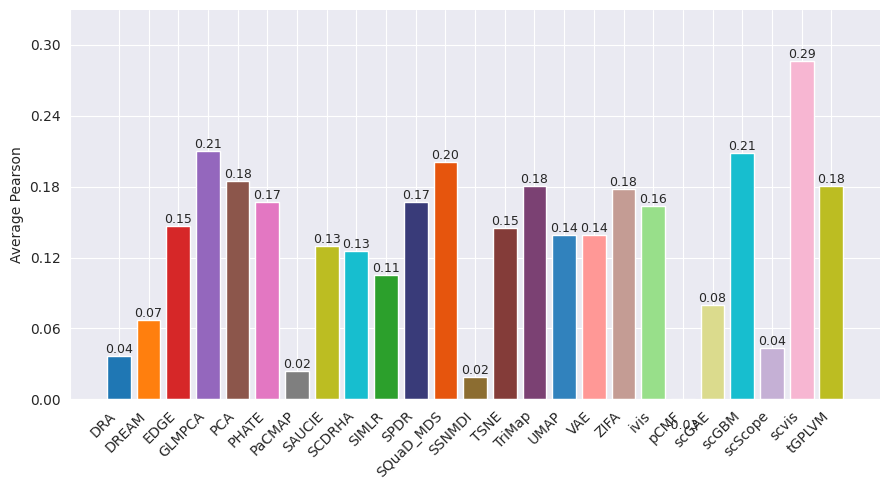

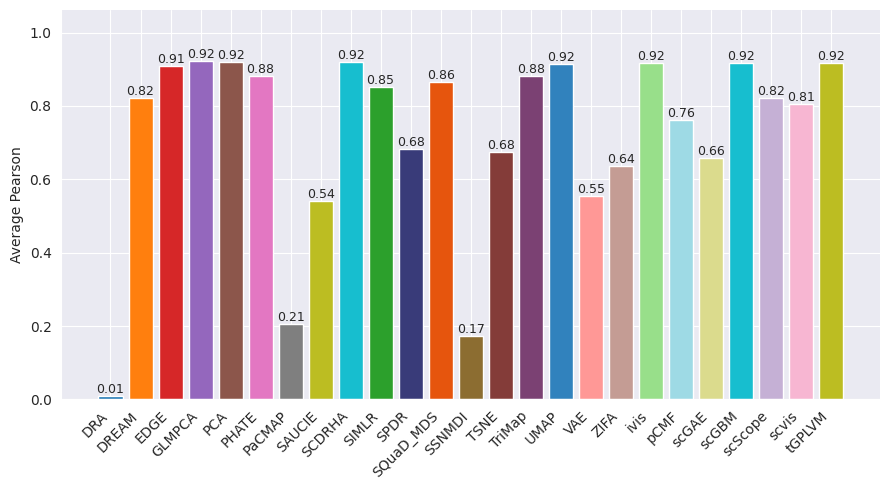

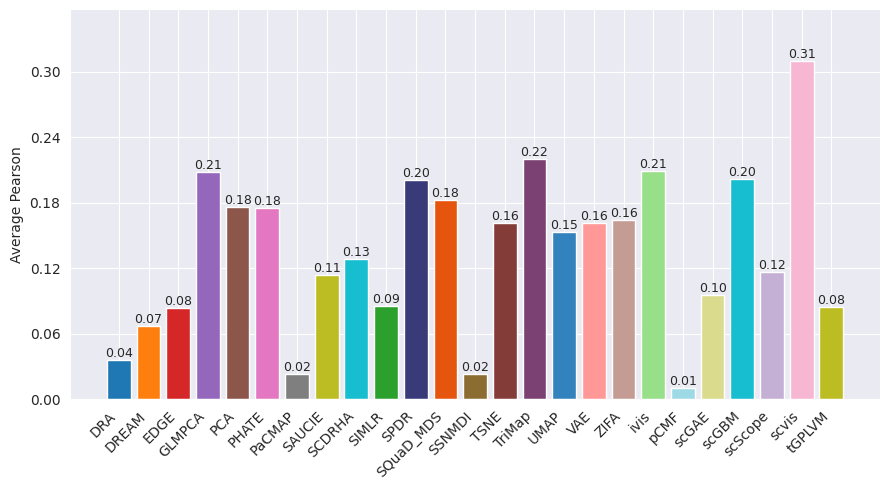

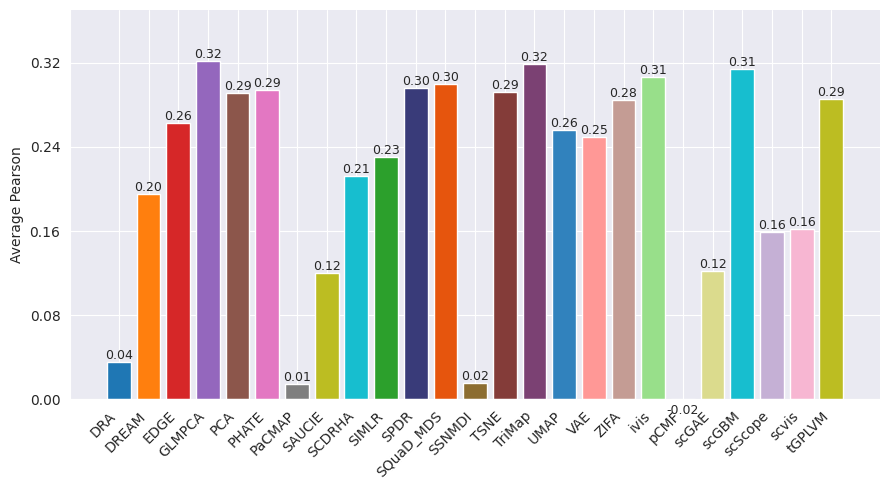

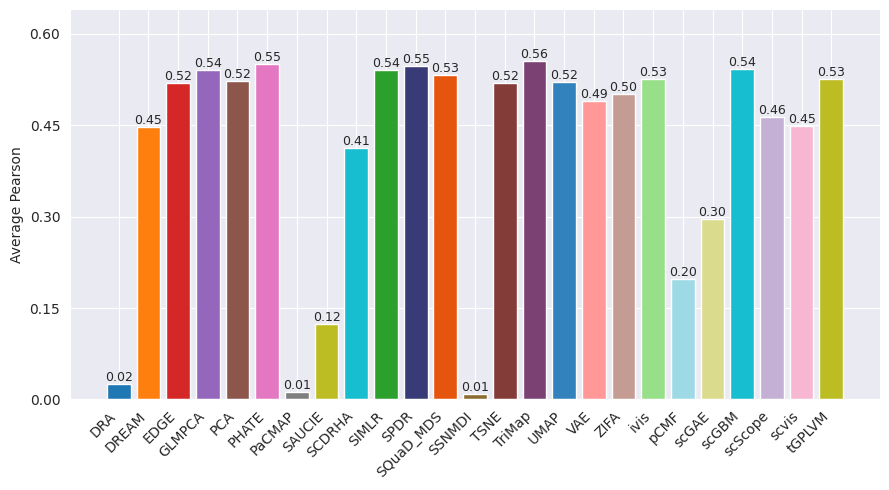

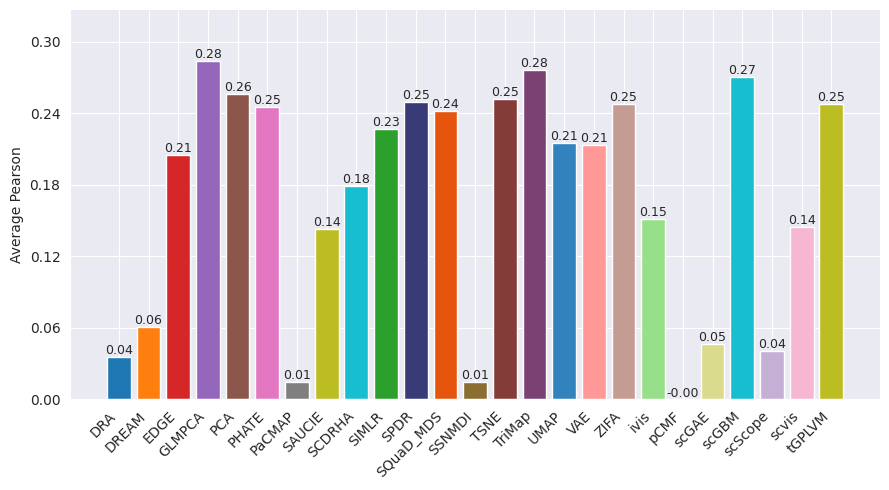

In [25]:
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.ticker import MaxNLocator

# 定义颜色列表
colors = [
    "#1f77b4", "#ff7f0e", "#d62728", "#9467bd", "#8c564b", "#e377c2",
    "#7f7f7f", "#bcbd22", "#17becf", "#2ca02c",
    "#393b79", "#e6550d", "#8c6d31", "#843c39", "#7b4173",
    "#3182bd", "#ff9896", "#c49c94", "#98df8a", "#9edae5",
    "#dbdb8d", "#17becf", "#c5b0d5", "#f7b6d2", "#bcbd22", "#aec7e8"
]

dr1_local = ['knn_30','svm','nkr_30','aji_30']
dr1_global = ['random_triplet','spearman','k-nearest','centroid_distance']
dr2_local = ['T_30','C_30']
dr3_local = ['Mrre_false_30','Mrre_missing_30','nh_30']
dr3_global = ['Pearson']

fragments = ['cells','genes','celltypes','batchs','batch_strength','dropouts','des','de_strength','outs']
for fragment in fragments:
    for dr1 in dr3_global:
        csv_path = f"/home/henu/work/result/score/synthetic/{fragment}_dr3.csv"
        metric = f"{dr1}"

        df = pd.read_csv(csv_path)

        # # 兼容：若第二列不是 NMI，就自动使用第二列为指标列
        # if metric not in df.columns and len(df.columns) >= 2:
        #     metric = df.columns[1]

        # 去掉 UMAP 方法
        df = df[df["Method"] != "ParametricUMAP200"].copy()
        df = df[df["Method"] != "ParametricUMAP50"].copy()
        df = df[df["Method"] != "SQuaD_MDS"].copy()

        # 将 SQuaD_MDS_hybrid 的名字改为 SQuaD_MDS
        df['Method'] = df['Method'].replace({'SQuaD_MDS_hybrid': 'SQuaD_MDS'})

        # 不按大小排序，保持原始文件顺序
        df = df[["Method", metric]].copy()

        # 画图
        plt.figure(figsize=(9, 5))  # 宽一点便于放下方法名
        bars = plt.bar(df["Method"], df[metric], color=colors[:len(df)])

        # y 轴范围给一点头部空间以便数值标注
        ymax = df[metric].max() if len(df) else 1.0
        plt.ylim(0, ymax * 1.15)

        # 轴标题与刻度
        # plt.xlabel("Method")
        plt.ylabel(f"Average {metric}")
        # plt.title(f"Average {metric} by Method")
        plt.gca().yaxis.set_major_locator(MaxNLocator(nbins=6))  # 让刻度更整齐

        # 隐藏上边和右边的边框线
        plt.gca().spines['top'].set_visible(False)
        plt.gca().spines['right'].set_visible(False)

        # x 轴标签旋转，避免重叠
        plt.xticks(rotation=45, ha="right")

        # 在柱顶标注数值（保留2位小数）
        for rect, val in zip(bars, df[metric].values):
            height = rect.get_height()
            plt.text(
                rect.get_x() + rect.get_width() / 2,
                height,
                f"{val:.2f}",
                ha="center",
                va="bottom",
                fontsize=9
            )

        plt.tight_layout()

        # 保存图片
        out_svg = f"/home/henu/work/result/figures/50SimulateDatasets/global/{fragment}_{dr1}.svg"
        plt.savefig(out_svg)
        plt.show()

### 合成数据集--聚类均值柱状图

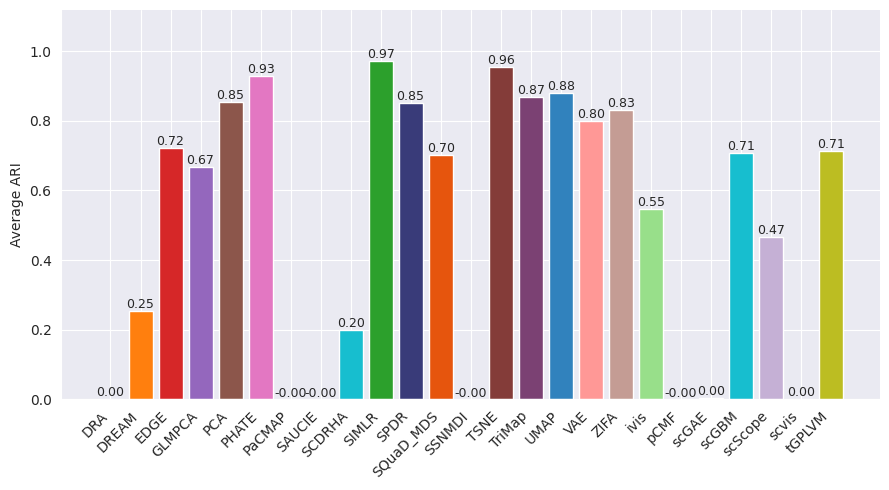

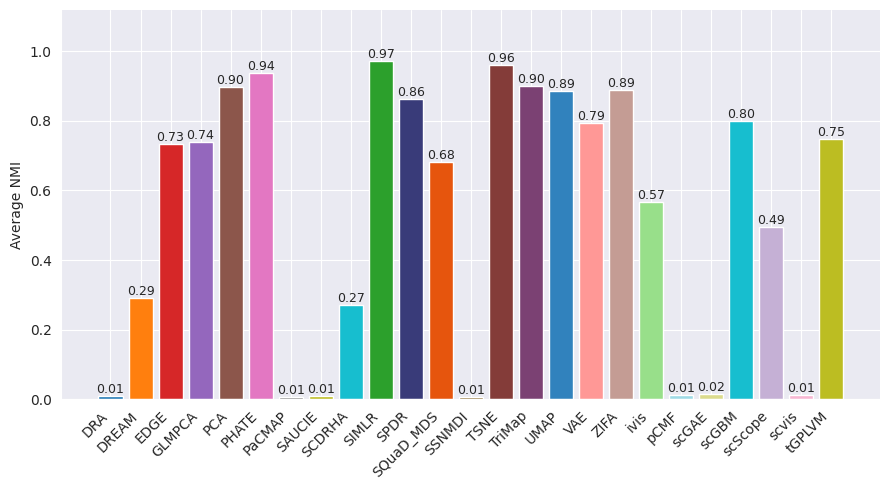

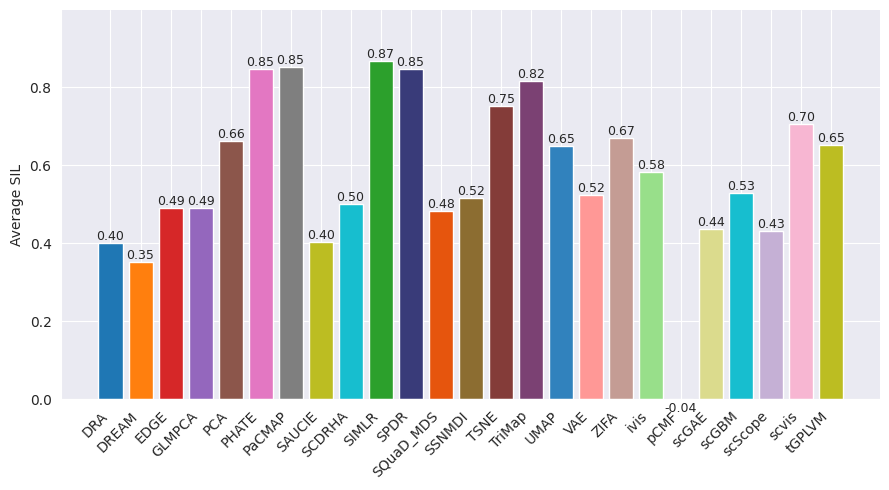

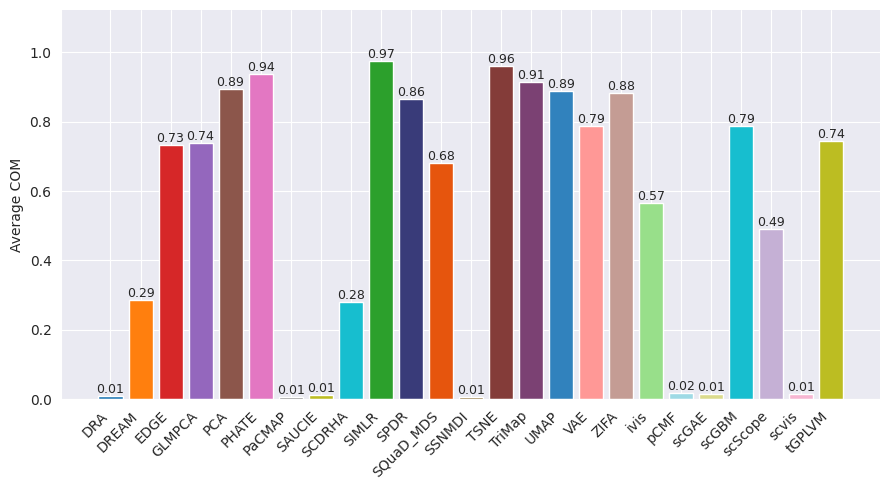

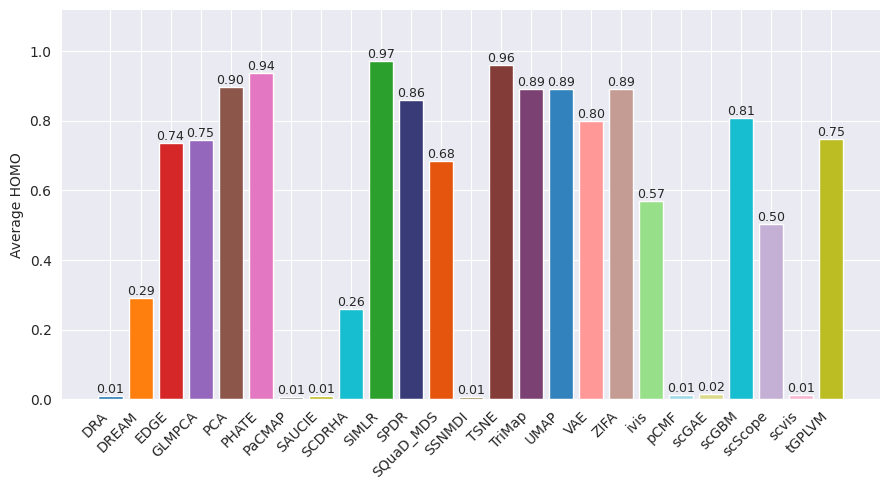

...

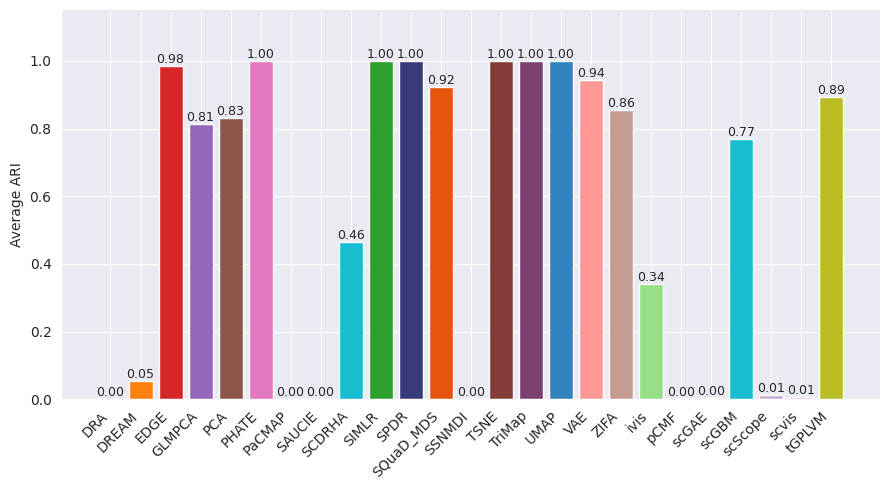

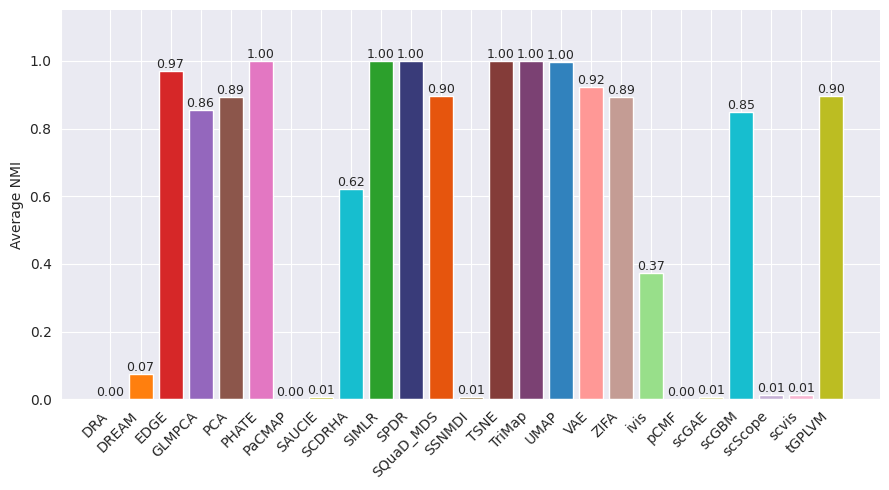

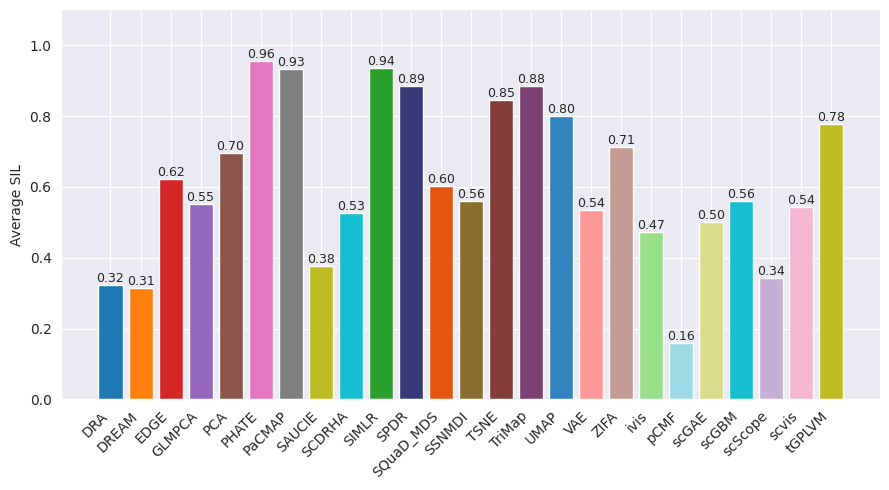

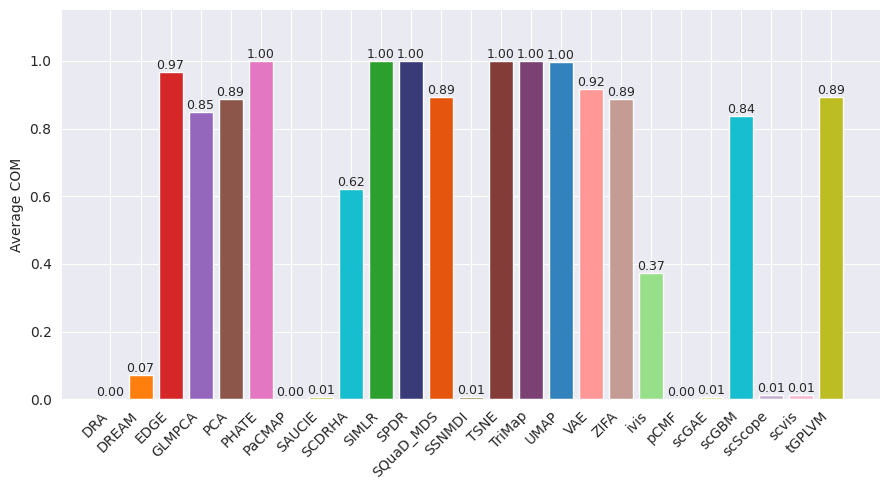

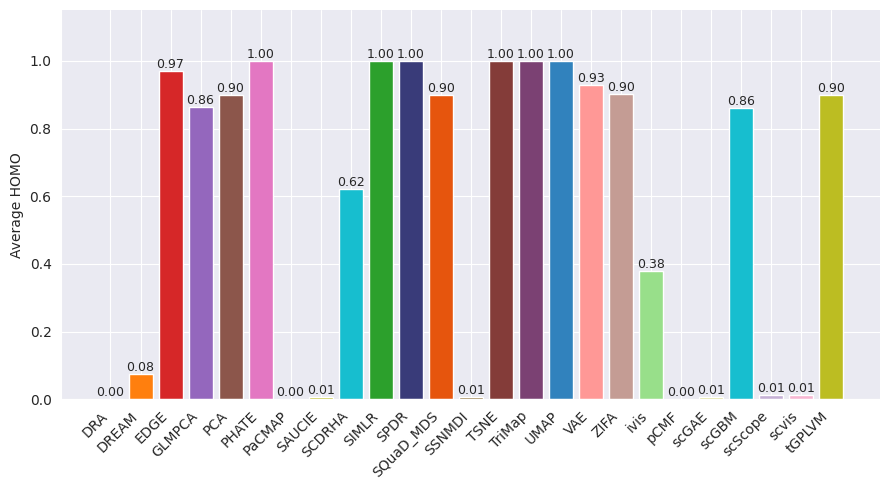

In [26]:
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.ticker import MaxNLocator

# 定义颜色列表
colors = [
    "#1f77b4", "#ff7f0e", "#d62728", "#9467bd", "#8c564b", "#e377c2",
    "#7f7f7f", "#bcbd22", "#17becf", "#2ca02c",
    "#393b79", "#e6550d", "#8c6d31", "#843c39", "#7b4173",
    "#3182bd", "#ff9896", "#c49c94", "#98df8a", "#9edae5",
    "#dbdb8d", "#17becf", "#c5b0d5", "#f7b6d2", "#bcbd22", "#aec7e8"
]


fragments = ['cells','genes','celltypes','batchs','batch_strength','dropouts','des','de_strength','outs']
fragment2 = ['ARI','NMI','SIL','COM','HOMO']

for fragment in fragments:
    for fra2 in fragment2:
        # 读取结果
        csv_path = f"/home/henu/work/result/score/synthetic/kmeans/{fra2}/{fragment}_{fra2}.csv"
        metric = f"{fra2}"

        df = pd.read_csv(csv_path)

        # 兼容：若第二列不是 NMI，就自动使用第二列为指标列
        if metric not in df.columns and len(df.columns) >= 2:
            metric = df.columns[1]

        # 去掉 UMAP 方法
        df = df[df["Method"] != "ParametricUMAP200"].copy()
        df = df[df["Method"] != "ParametricUMAP50"].copy()
        df = df[df["Method"] != "SQuaD_MDS"].copy()

        # 将 SQuaD_MDS_hybrid 的名字改为 SQuaD_MDS
        df['Method'] = df['Method'].replace({'SQuaD_MDS_hybrid': 'SQuaD_MDS'})

        # 不按大小排序，保持原始文件顺序
        df = df[["Method", metric]].copy()

        # 画图
        plt.figure(figsize=(9, 5))  # 宽一点便于放下方法名
        bars = plt.bar(df["Method"], df[metric], color=colors[:len(df)])

        # y 轴范围给一点头部空间以便数值标注
        ymax = df[metric].max() if len(df) else 1.0
        plt.ylim(0, ymax * 1.15)

        # 轴标题与刻度
        # plt.xlabel("Method")
        plt.ylabel(f"Average {metric}")
        # plt.title(f"Average {metric} by Method")
        plt.gca().yaxis.set_major_locator(MaxNLocator(nbins=6))  # 让刻度更整齐

        # 隐藏上边和右边的边框线
        plt.gca().spines['top'].set_visible(False)
        plt.gca().spines['right'].set_visible(False)

        # x 轴标签旋转，避免重叠
        plt.xticks(rotation=45, ha="right")

        # 在柱顶标注数值（保留2位小数）
        for rect, val in zip(bars, df[metric].values):
            height = rect.get_height()
            plt.text(
                rect.get_x() + rect.get_width() / 2,
                height,
                f"{val:.2f}",
                ha="center",
                va="bottom",
                fontsize=9
            )

        plt.tight_layout()

        # 保存图片
        out_svg = f"/home/henu/work/result/figures/50SimulateDatasets/kmeans/{fragment}_{fra2}.svg"
        plt.savefig(out_svg)
        plt.show()

### 整合柱状图--聚类

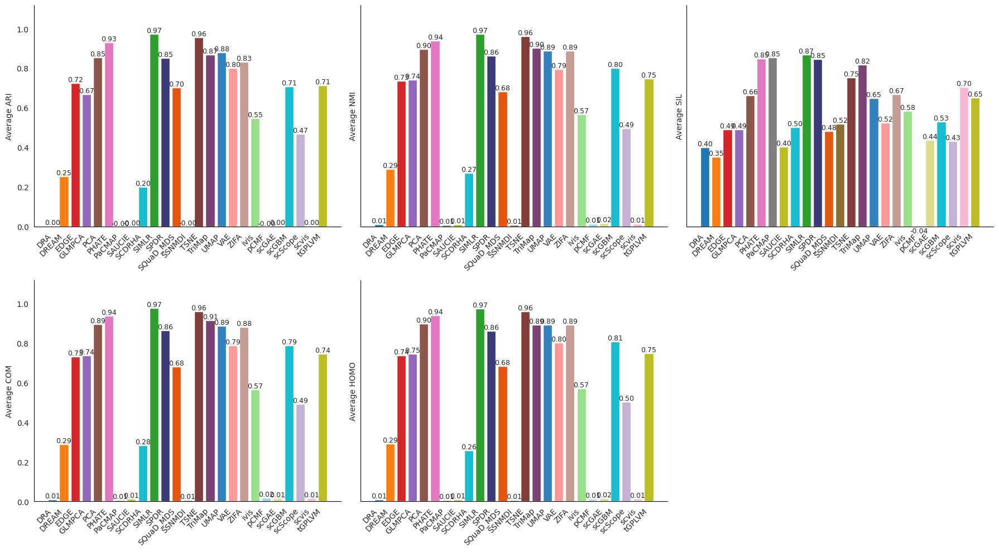

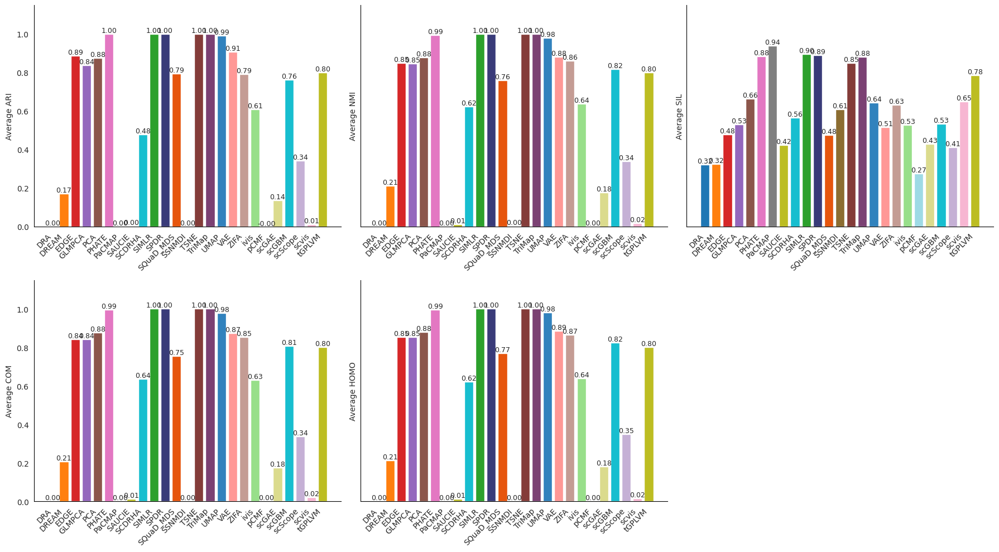

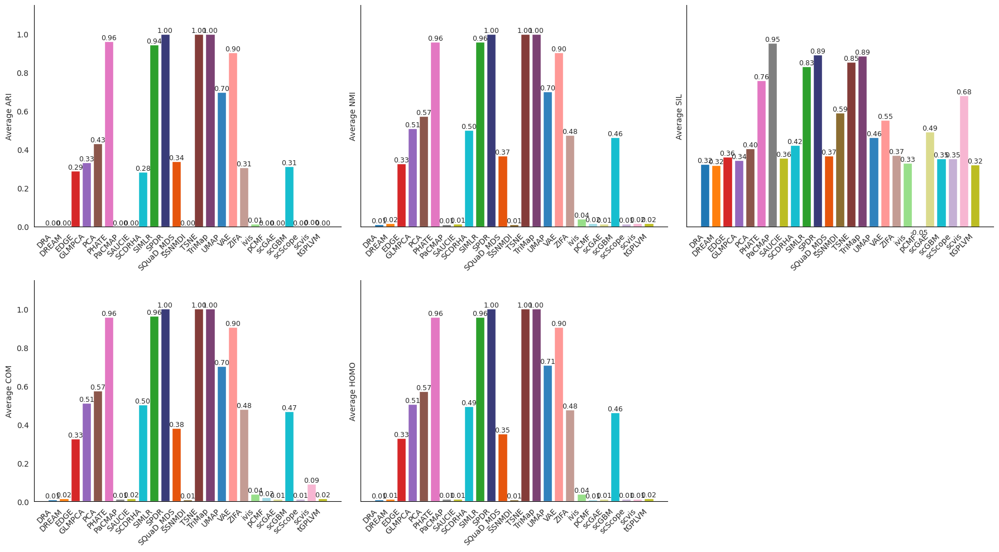

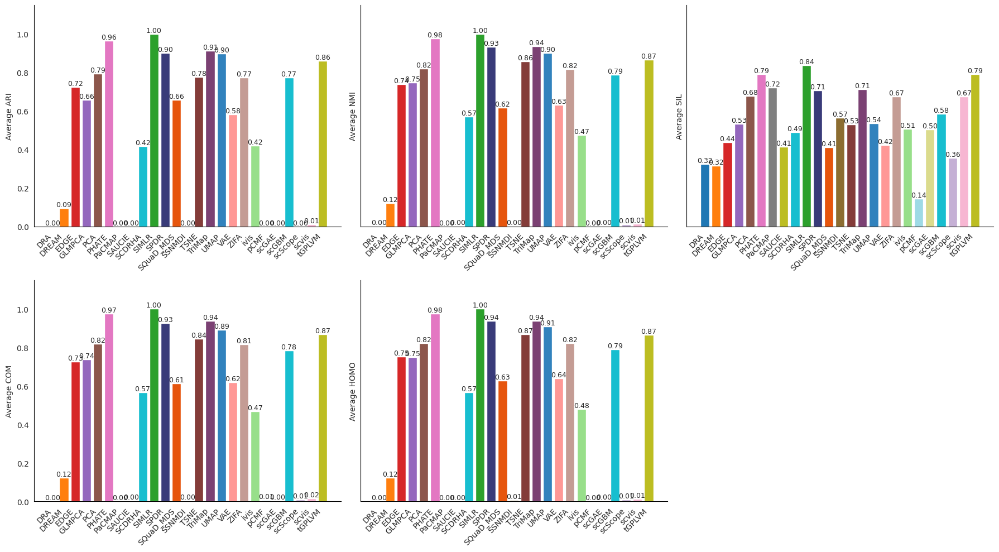

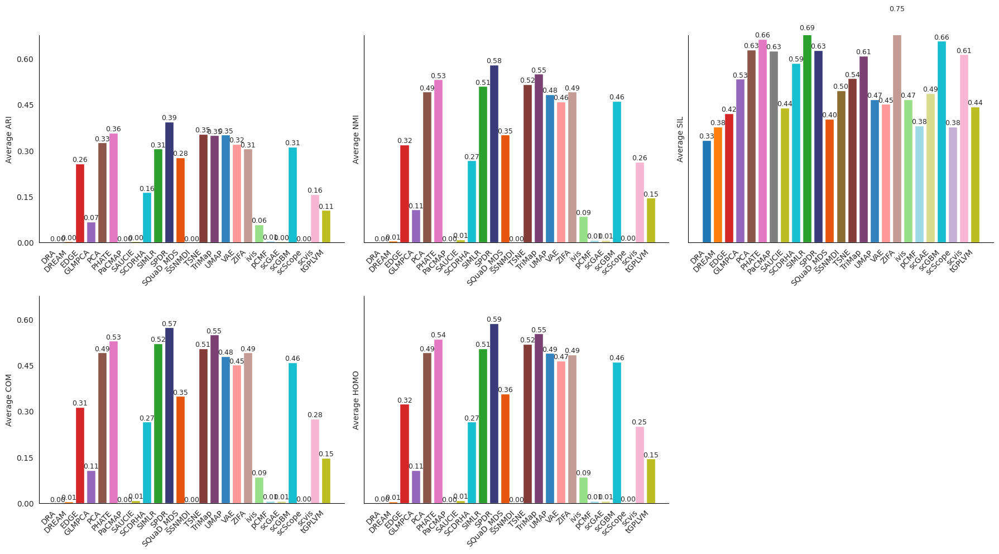

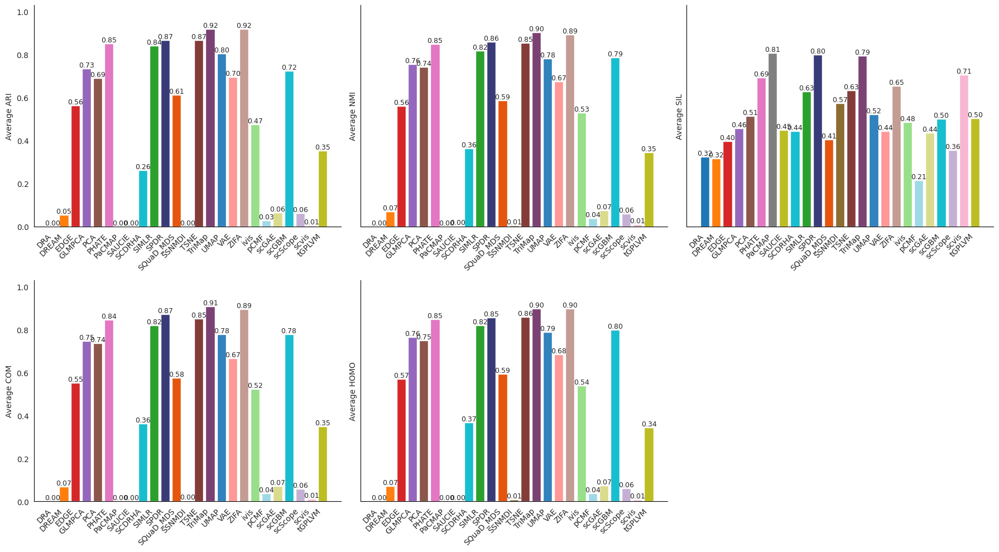

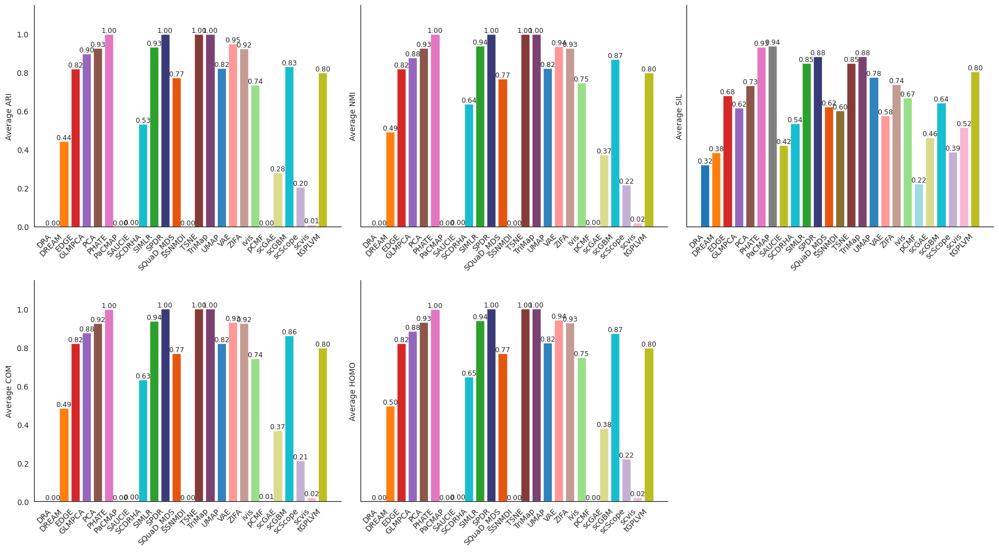

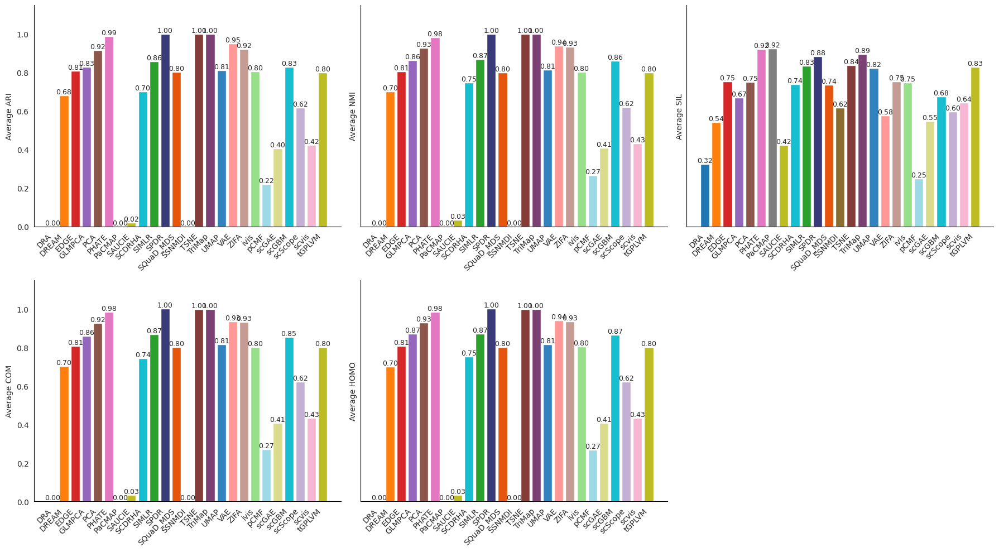

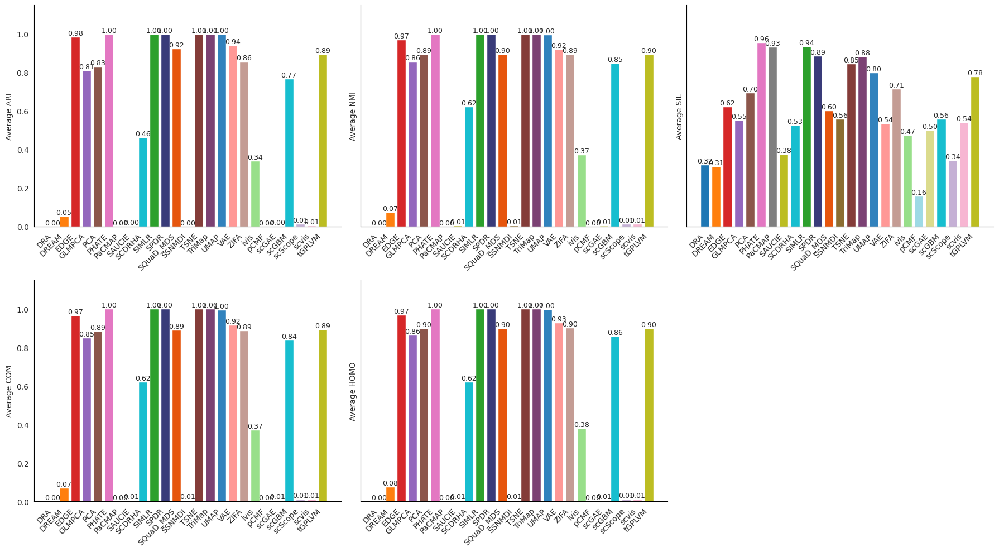

In [38]:
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.ticker import MaxNLocator
import numpy as np

# 定义颜色列表
colors = [
    "#1f77b4", "#ff7f0e", "#d62728", "#9467bd", "#8c564b", "#e377c2",
    "#7f7f7f", "#bcbd22", "#17becf", "#2ca02c",
    "#393b79", "#e6550d", "#8c6d31", "#843c39", "#7b4173",
    "#3182bd", "#ff9896", "#c49c94", "#98df8a", "#9edae5",
    "#dbdb8d", "#17becf", "#c5b0d5", "#f7b6d2", "#bcbd22", "#aec7e8"
]

fragments = ['cells','genes','celltypes','batchs','batch_strength','dropouts','des','de_strength','outs']
fragment2 = ['ARI', 'NMI', 'SIL', 'COM', 'HOMO']

for fragment in fragments:
    # 创建 3+2 的两行排布（上 3、下 2）
    fig = plt.figure(figsize=(18, 10))
    mosaic = [
        ["A", "B", "C"],
        ["D", "E", "."],  # "." 表示空白处
    ]
    axes_map = fig.subplot_mosaic(mosaic, sharey=True)
    axes = [axes_map[k] for k in ["A", "B", "C", "D", "E"]]

    # 全局背景设为白色
    fig.set_facecolor("white")

    for idx, fra2 in enumerate(fragment2):
        # 读取结果
        csv_path = f"/home/henu/work/result/score/synthetic/kmeans/{fra2}/{fragment}_{fra2}.csv"
        metric = f"{fra2}"

        df = pd.read_csv(csv_path)

        # 兼容：若第二列不是指定指标，就自动使用第二列为指标列
        if metric not in df.columns and len(df.columns) >= 2:
            metric = df.columns[1]

        # 去掉不需要的方法
        df = df[df["Method"] != "ParametricUMAP200"].copy()
        df = df[df["Method"] != "ParametricUMAP50"].copy()
        df = df[df["Method"] != "SQuaD_MDS"].copy()

        # 名称替换
        df["Method"] = df["Method"].replace({"SQuaD_MDS_hybrid": "SQuaD_MDS"})

        # 保持原始顺序
        df = df[["Method", metric]].copy()

        ax = axes[idx]

        # 子图白色背景、无网格线
        ax.set_facecolor("white")
        ax.grid(False)

        # 柱状图
        x = np.arange(len(df))
        bars = ax.bar(x, df[metric].values, color=colors[:len(df)])

        # y 轴范围留出顶部空间用于数值标注
        ymax = df[metric].max() if len(df) else 1.0
        ax.set_ylim(0, ymax * 1.15)

        # 轴标题与刻度
        ax.set_ylabel(f"Average {metric}")
        ax.yaxis.set_major_locator(MaxNLocator(nbins=6))

        # x 轴刻度与标签
        ax.set_xticks(x)
        ax.set_xticklabels(df["Method"], rotation=45, ha="right")

        # 隐藏上边和右边边框线
        ax.spines["top"].set_visible(False)
        ax.spines["right"].set_visible(False)

        ax.spines["left"].set_visible(True)
        ax.spines["bottom"].set_visible(True)
        # ax.spines["left"].set_linewidth(1.2)
        # ax.spines["bottom"].set_linewidth(1.2)
        ax.spines["left"].set_color("black")
        ax.spines["bottom"].set_color("black")

        # 柱顶数值标注（保留 2 位小数）
        for rect, val in zip(bars, df[metric].values):
            height = rect.get_height()
            ax.text(
                rect.get_x() + rect.get_width() / 2,
                height,
                f"{val:.2f}",
                ha="center",
                va="bottom",
                fontsize=9,
            )

    # 调整布局与保存
    plt.tight_layout()
    out_svg = f"/home/henu/work/result/figures/50SimulateDatasets/Integration/kmeans/{fragment}.svg"
    plt.savefig(out_svg)
    plt.show()

### 整合柱状图--结构保留

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.ticker import MaxNLocator
import numpy as np

# 定义颜色列表
colors = [
    "#1f77b4", "#ff7f0e", "#d62728", "#9467bd", "#8c564b", "#e377c2",
    "#7f7f7f", "#bcbd22", "#17becf", "#2ca02c",
    "#393b79", "#e6550d", "#8c6d31", "#843c39", "#7b4173",
    "#3182bd", "#ff9896", "#c49c94", "#98df8a", "#9edae5",
    "#dbdb8d", "#17becf", "#c5b0d5", "#f7b6d2", "#bcbd22", "#aec7e8"
]

fragments = ['cells','genes','celltypes','batchs','batch_strength','dropouts','des','de_strength','outs']

dr1_local = ['knn_30','svm','nkr_30','aji_30']
dr1_global = ['random_triplet','spearman','k-nearest','centroid_distance']
dr2_local = ['T_30','C_30']
dr3_local = ['Mrre_false_30','Mrre_missing_30','nh_30']
dr3_global = ['Pearson']

for fragment in fragments:
    for dr1 in dr1_global:
        # 创建 3+2 的两行排布（上 3、下 2）
        fig = plt.figure(figsize=(18, 10))
        mosaic = [
            ["A", "B", "C"],
            ["D", "E", "."],  # "." 表示空白处
        ]
        axes_map = fig.subplot_mosaic(mosaic, sharey=True)
        axes = [axes_map[k] for k in ["A", "B", "C", "D", "E"]]

        # 全局背景设为白色
        fig.set_facecolor("white")

        for idx, fra2 in enumerate(fragment2):
            # 读取结果
            csv_path = f"/home/henu/work/result/score/synthetic/{fragment}_{dr1}.csv"
            metric = f"{dr1}"

            df = pd.read_csv(csv_path)

            # 兼容：若第二列不是指定指标，就自动使用第二列为指标列
            if metric not in df.columns and len(df.columns) >= 2:
                metric = df.columns[1]

            # 去掉不需要的方法
            df = df[df["Method"] != "ParametricUMAP200"].copy()
            df = df[df["Method"] != "ParametricUMAP50"].copy()
            df = df[df["Method"] != "SQuaD_MDS"].copy()

            # 名称替换
            df["Method"] = df["Method"].replace({"SQuaD_MDS_hybrid": "SQuaD_MDS"})

            # 保持原始顺序
            df = df[["Method", metric]].copy()

            ax = axes[idx]

            # 子图白色背景、无网格线
            ax.set_facecolor("white")
            ax.grid(False)

            # 柱状图
            x = np.arange(len(df))
            bars = ax.bar(x, df[metric].values, color=colors[:len(df)])

            # y 轴范围留出顶部空间用于数值标注
            ymax = df[metric].max() if len(df) else 1.0
            ax.set_ylim(0, ymax * 1.15)

            # 轴标题与刻度
            ax.set_ylabel(f"Average {metric}")
            ax.yaxis.set_major_locator(MaxNLocator(nbins=6))

            # x 轴刻度与标签
            ax.set_xticks(x)
            ax.set_xticklabels(df["Method"], rotation=45, ha="right")

            # 隐藏上边和右边边框线
            ax.spines["top"].set_visible(False)
            ax.spines["right"].set_visible(False)

            ax.spines["left"].set_visible(True)
            ax.spines["bottom"].set_visible(True)
            # ax.spines["left"].set_linewidth(1.2)
            # ax.spines["bottom"].set_linewidth(1.2)
            ax.spines["left"].set_color("black")
            ax.spines["bottom"].set_color("black")

            # 柱顶数值标注（保留 2 位小数）
            for rect, val in zip(bars, df[metric].values):
                height = rect.get_height()
                ax.text(
                    rect.get_x() + rect.get_width() / 2,
                    height,
                    f"{val:.2f}",
                    ha="center",
                    va="bottom",
                    fontsize=9,
                )

        # 调整布局与保存
        plt.tight_layout()
        out_svg = f"/home/henu/work/result/figures/50SimulateDatasets/Integration/kmeans/{fragment}.svg"
        plt.savefig(out_svg)
        plt.show()

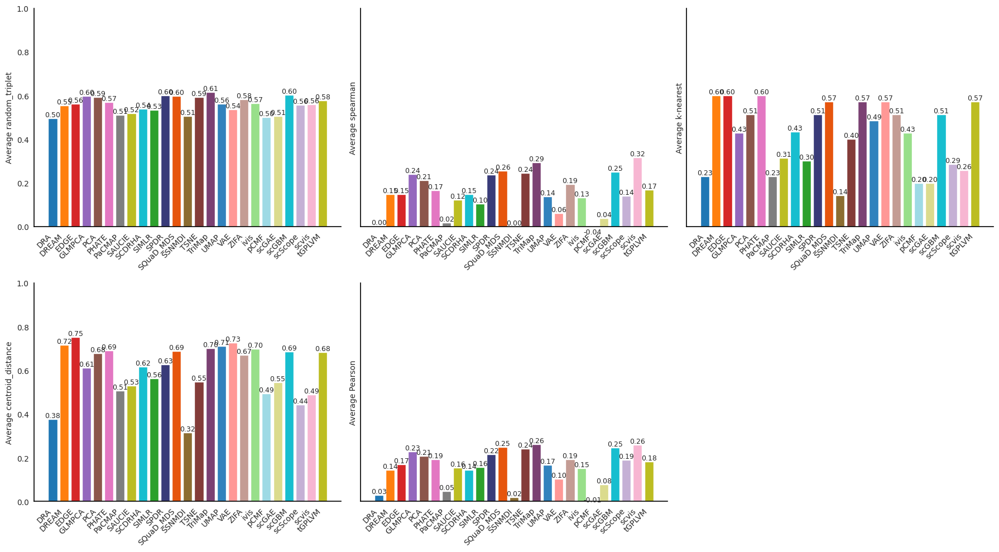

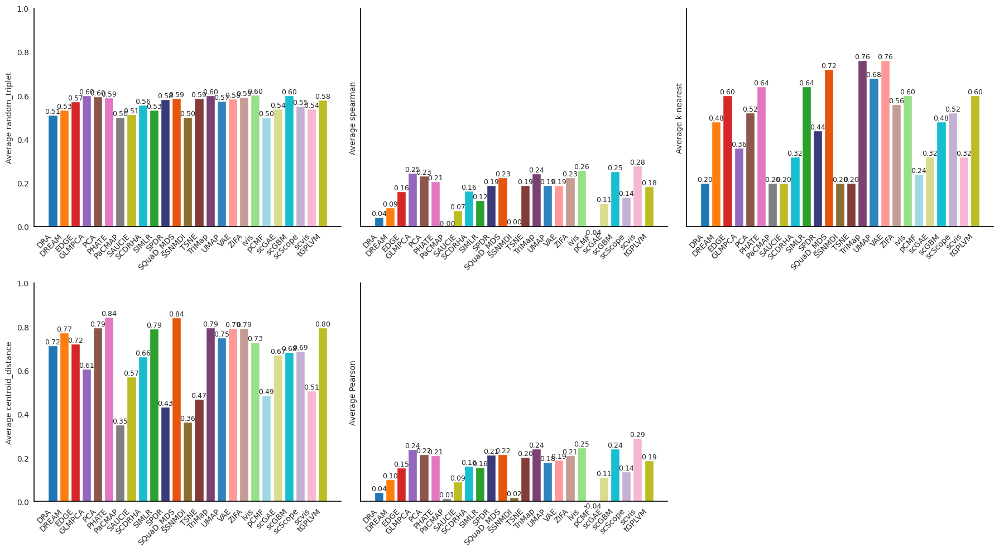

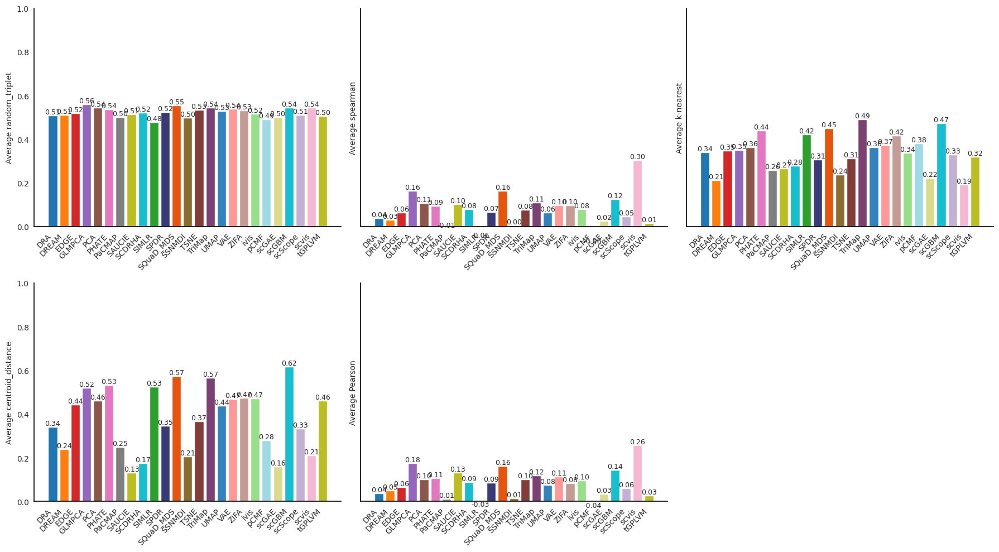

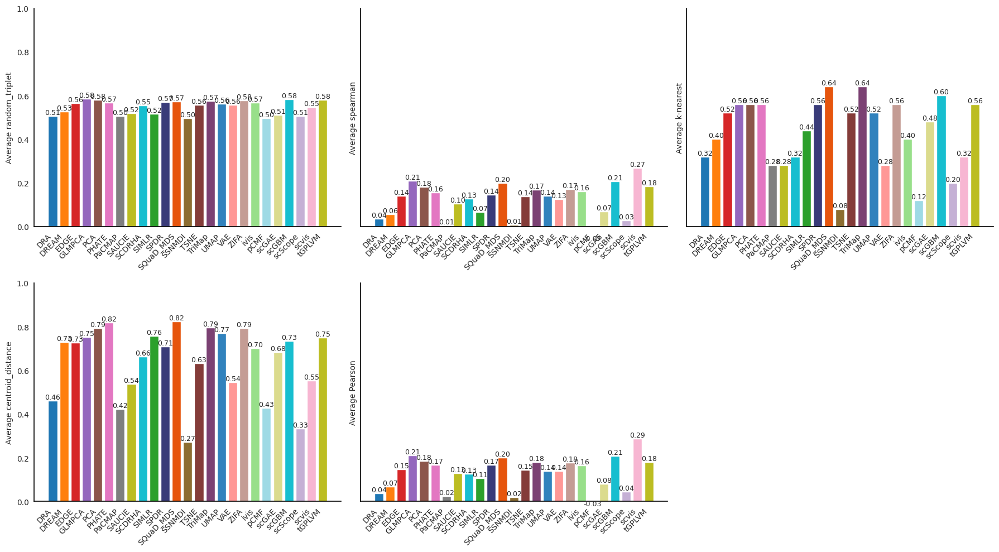

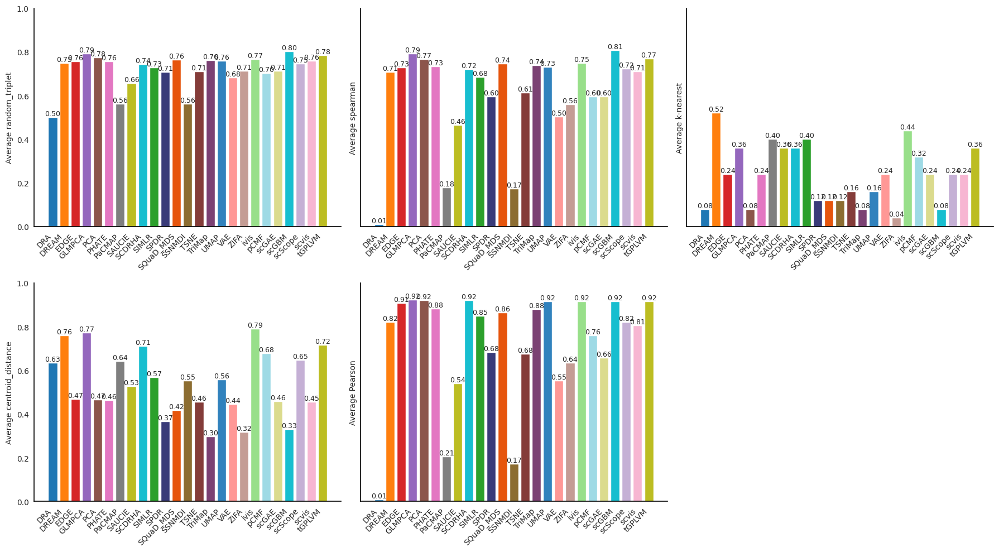

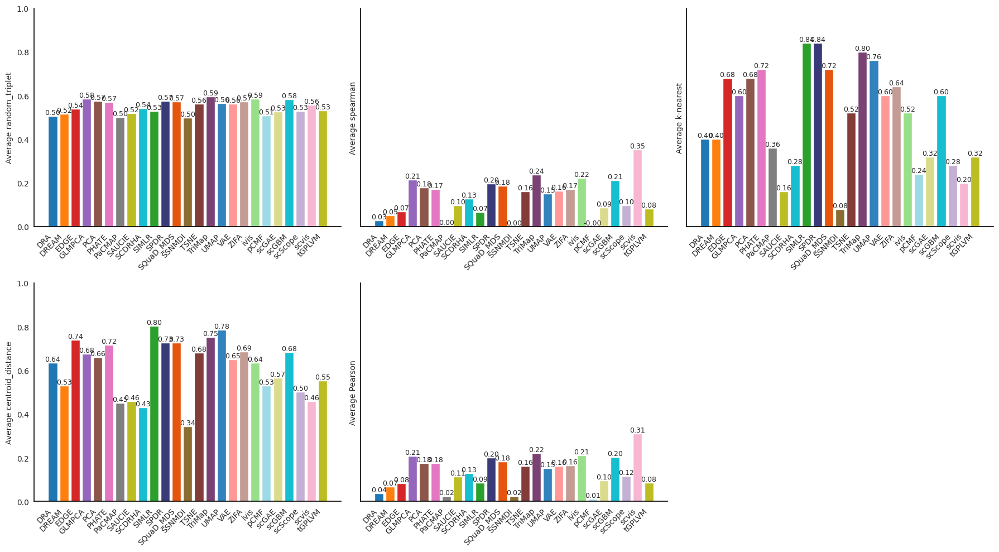

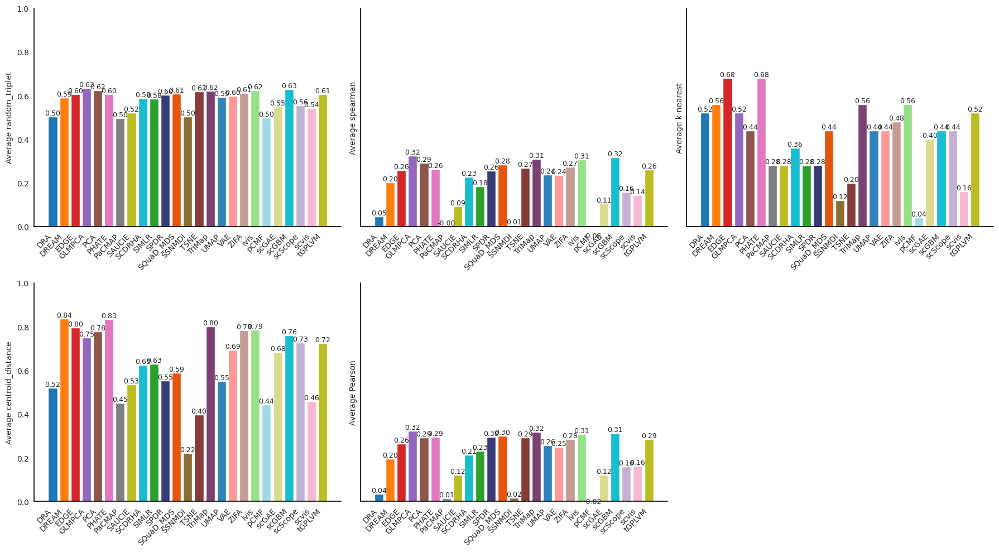

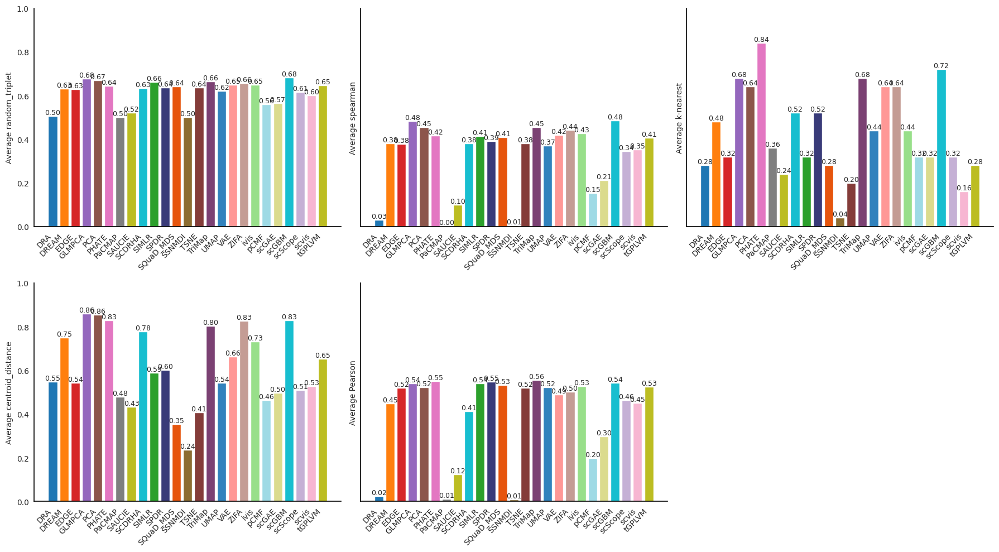

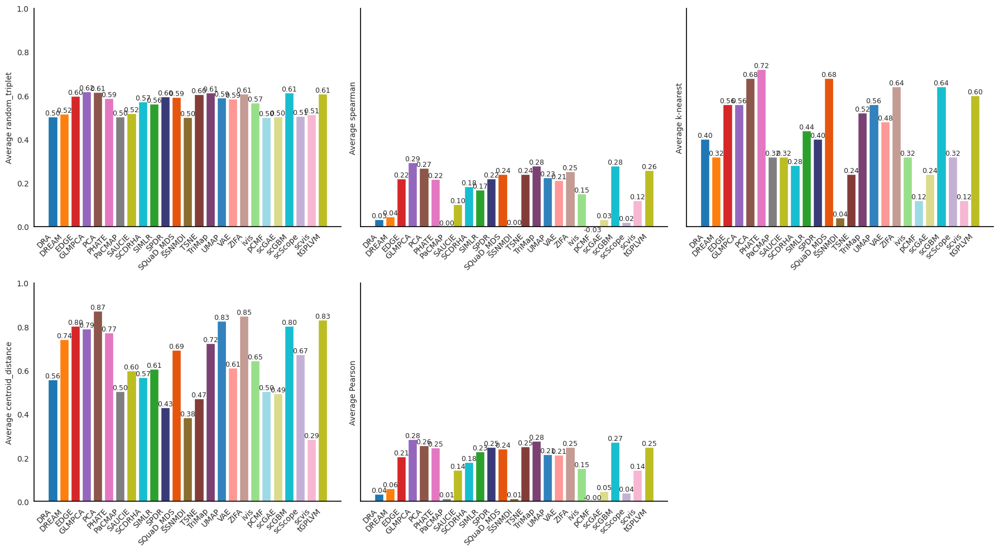

In [40]:
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.ticker import MaxNLocator
import numpy as np

# 定义颜色列表
colors = [
    "#1f77b4", "#ff7f0e", "#d62728", "#9467bd", "#8c564b", "#e377c2",
    "#7f7f7f", "#bcbd22", "#17becf", "#2ca02c",
    "#393b79", "#e6550d", "#8c6d31", "#843c39", "#7b4173",
    "#3182bd", "#ff9896", "#c49c94", "#98df8a", "#9edae5",
    "#dbdb8d", "#17becf", "#c5b0d5", "#f7b6d2", "#bcbd22", "#aec7e8"
]

# 指标定义
dr1_local  = ['knn_30','svm','nkr_30','aji_30']
dr1_global = ['random_triplet','spearman','k-nearest','centroid_distance']  # 来自 dr1.csv（全局的 4 个）
dr2_local  = ['T_30','C_30']
dr3_local  = ['Mrre_false_30','Mrre_missing_30','nh_30']
dr3_global = ['Pearson']  # 来自 dr3.csv（全局的 1 个）

# 需要绘制的全局指标（保持顺序：4 个 dr1 + 1 个 dr3）
global_metrics = dr1_global + dr3_global

fragments = ['cells','genes','celltypes','batchs','batch_strength','dropouts','des','de_strength','outs']

for fragment in fragments:
    # === 创建 3+2 两行排布的 5 子图（与之前聚类图一致风格） ===
    fig = plt.figure(figsize=(18, 10))
    mosaic = [
        ["A", "B", "C"],
        ["D", "E", "."],  # "." 表示空白位
    ]
    ax_map = fig.subplot_mosaic(mosaic, sharey=True)
    axes = [ax_map[k] for k in ["A", "B", "C", "D", "E"]]

    # 全局白色背景
    fig.set_facecolor("white")

    for idx, metric in enumerate(global_metrics):
        # 根据指标决定源 CSV：dr1_global -> dr1.csv；dr3_global -> dr3.csv
        if metric in dr1_global:
            csv_path = f"/home/henu/work/result/score/synthetic/{fragment}_dr1.csv"
        elif metric in dr3_global:
            csv_path = f"/home/henu/work/result/score/synthetic/{fragment}_dr3.csv"
        else:
            # 不是全局指标就跳过（理论不会触发）
            continue

        df = pd.read_csv(csv_path)

        # 去掉不需要的方法
        df = df[df["Method"] != "ParametricUMAP200"].copy()
        df = df[df["Method"] != "ParametricUMAP50"].copy()
        df = df[df["Method"] != "SQuaD_MDS"].copy()

        # 名称替换
        df['Method'] = df['Method'].replace({'SQuaD_MDS_hybrid': 'SQuaD_MDS'})

        # 只保留方法列与当前指标列
        if metric not in df.columns:
            # 若 csv 中列名与期望不一致，可在此做兜底（例如第二列为该指标）
            if len(df.columns) >= 2:
                metric_col = df.columns[1]
            else:
                raise ValueError(f"{csv_path} 中找不到指标列 {metric}")
        else:
            metric_col = metric

        df = df[["Method", metric_col]].copy()

        ax = axes[idx]
        # 子图白底、无线条网格
        ax.set_facecolor("white")
        ax.grid(False)

        # 柱图
        x = np.arange(len(df))
        bars = ax.bar(x, df[metric_col].values, color=colors[:len(df)])

        # y 轴范围：顶部多留空间给数值标注
        # ymax = df[metric_col].max() if len(df) else 1.0
        # ax.set_ylim(0, ymax * 1.15)
        ax.set_ylim(0,1.0)
        ax.yaxis.set_major_locator(MaxNLocator(nbins=6))

        # 轴与刻度
        ax.set_ylabel(f"Average {metric}")
        ax.yaxis.set_major_locator(MaxNLocator(nbins=6))
        ax.set_xticks(x)
        ax.set_xticklabels(df["Method"], rotation=45, ha="right")

        # 隐藏上/右边框线；显式显示左/下（x、y 轴线），并加强可见度
        ax.spines["top"].set_visible(False)
        ax.spines["right"].set_visible(False)
        ax.spines["left"].set_visible(True)
        ax.spines["bottom"].set_visible(True)
        ax.spines["left"].set_linewidth(1.2)
        ax.spines["bottom"].set_linewidth(1.2)
        ax.spines["left"].set_color("black")
        ax.spines["bottom"].set_color("black")

        # 柱顶数值标注
        for rect, val in zip(bars, df[metric_col].values):
            height = rect.get_height()
            ax.text(
                rect.get_x() + rect.get_width() / 2,
                height,
                f"{val:.2f}",
                ha="center",
                va="bottom",
                fontsize=9
            )

        # 可选：子图标题为当前指标名（若不需要可注释）
        # ax.set_title(metric)

    plt.tight_layout()

    # 保存为单张图（该 fragment 的全局指标 5 子图）
    out_svg = f"/home/henu/work/result/figures/50SimulateDatasets/Integration/global/{fragment}.svg"
    plt.savefig(out_svg)
    plt.show()

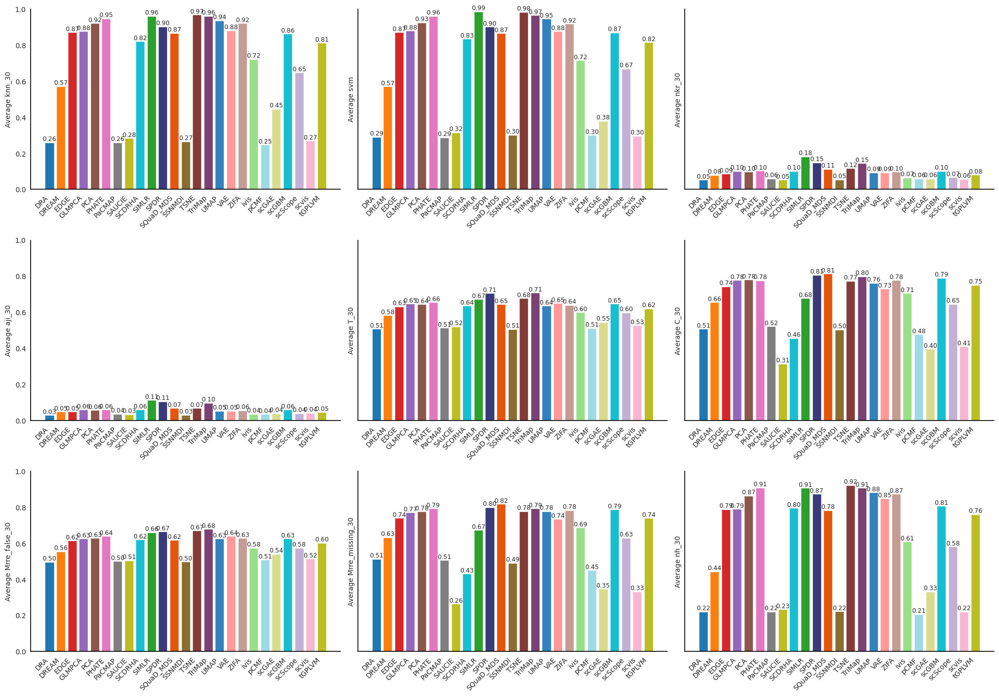

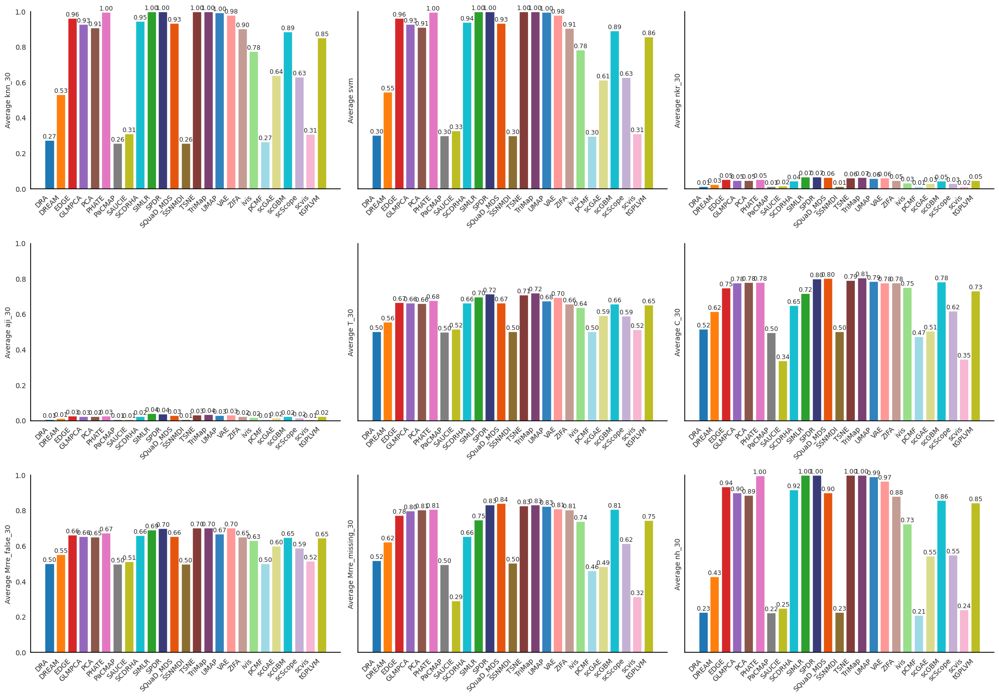

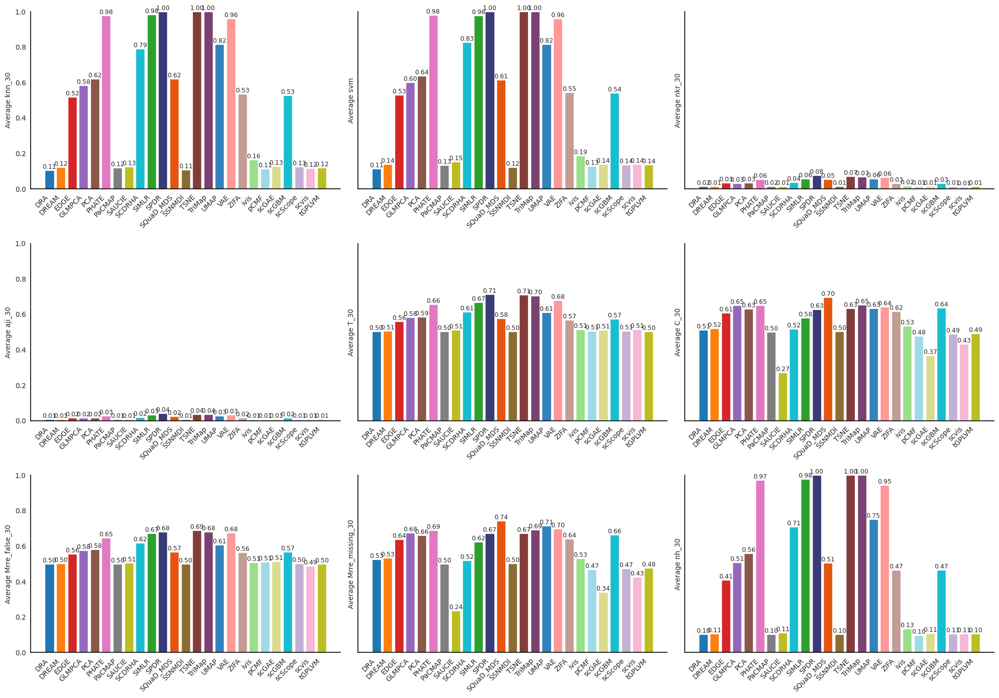

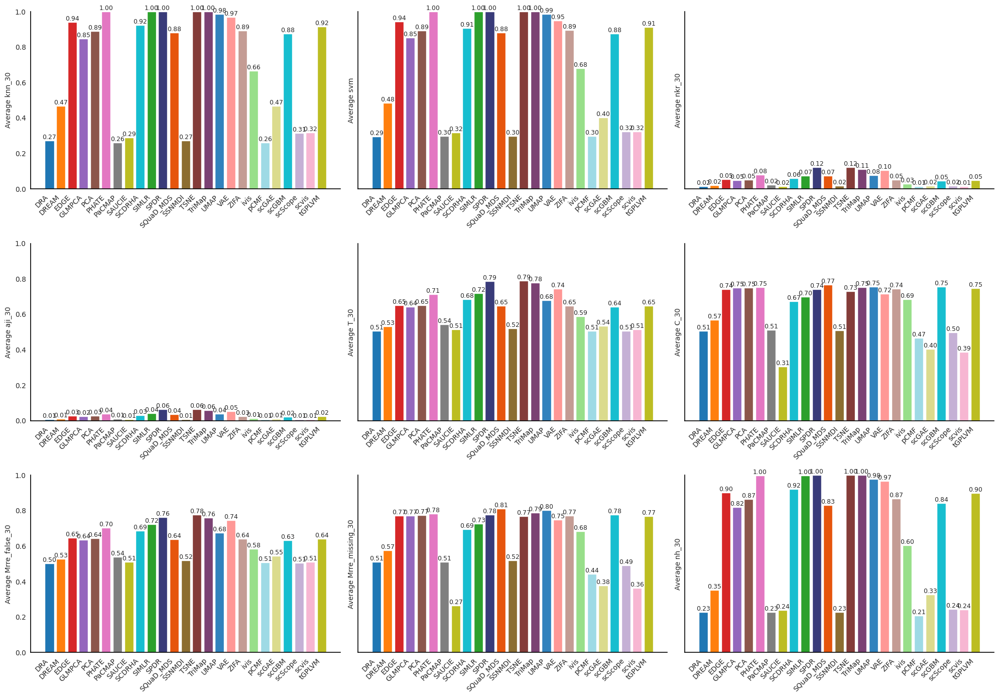

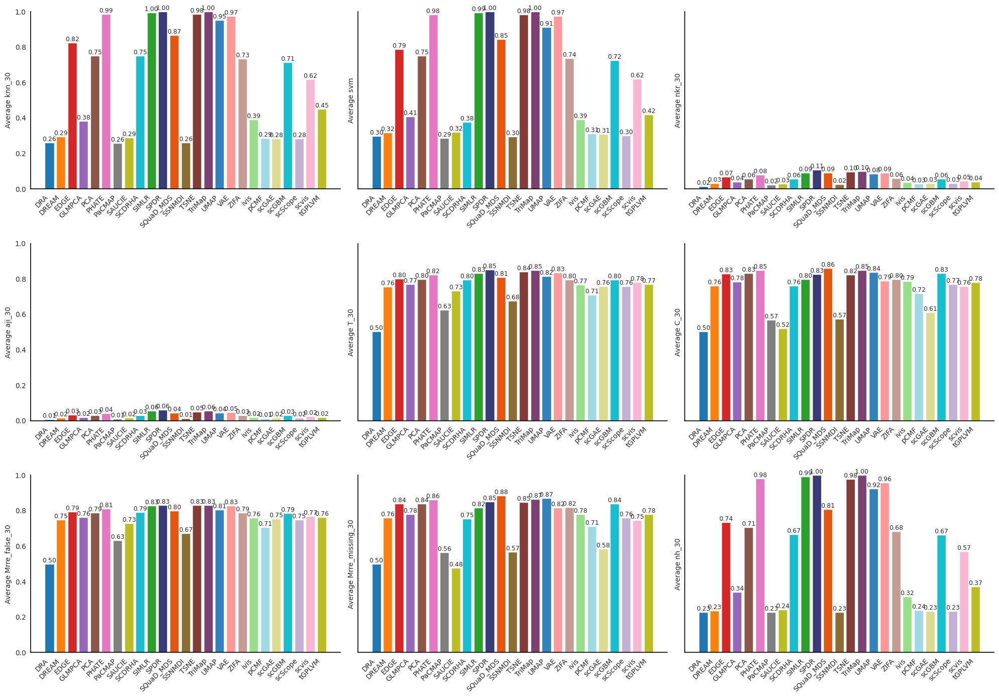

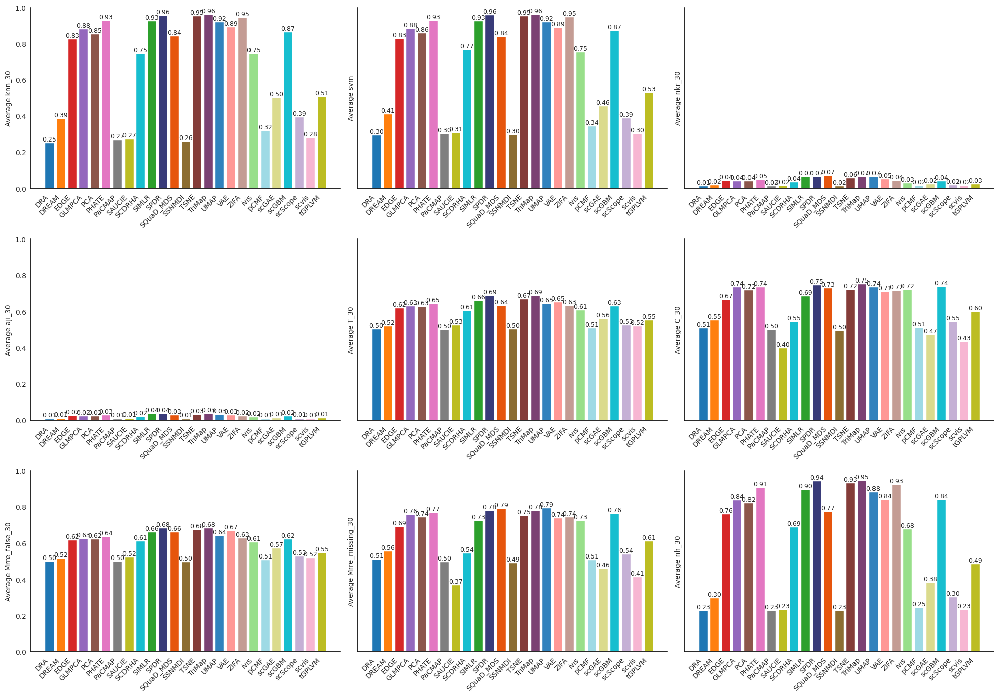

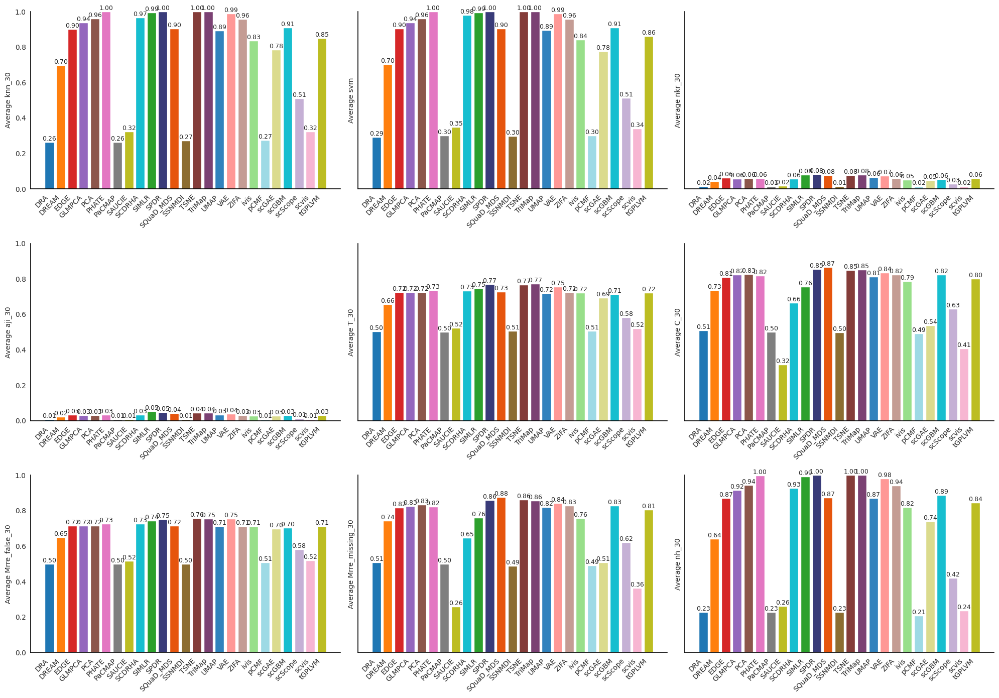

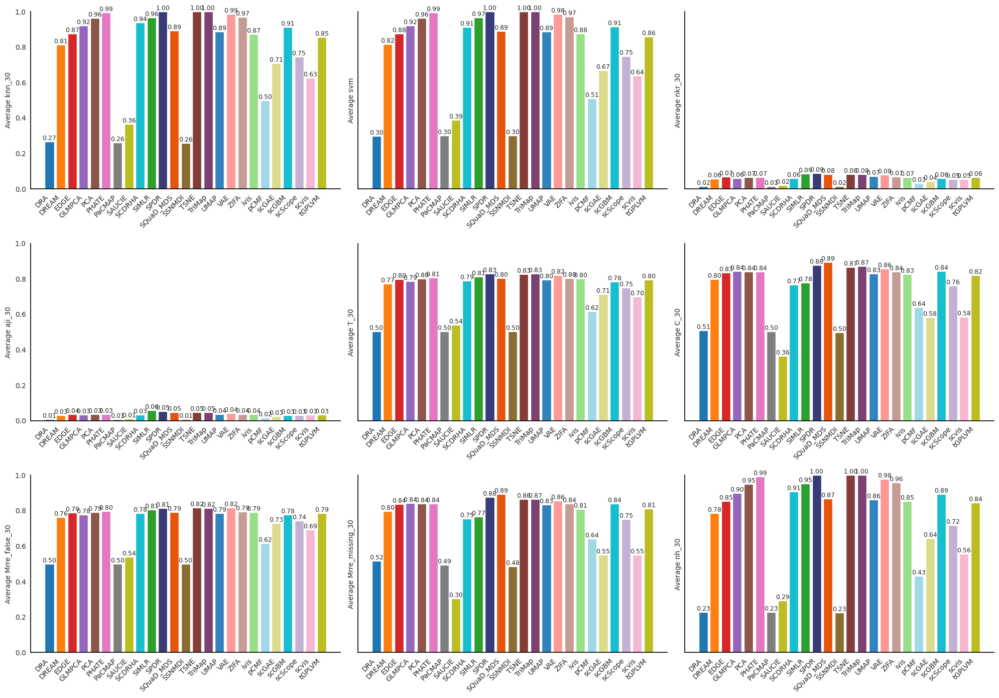

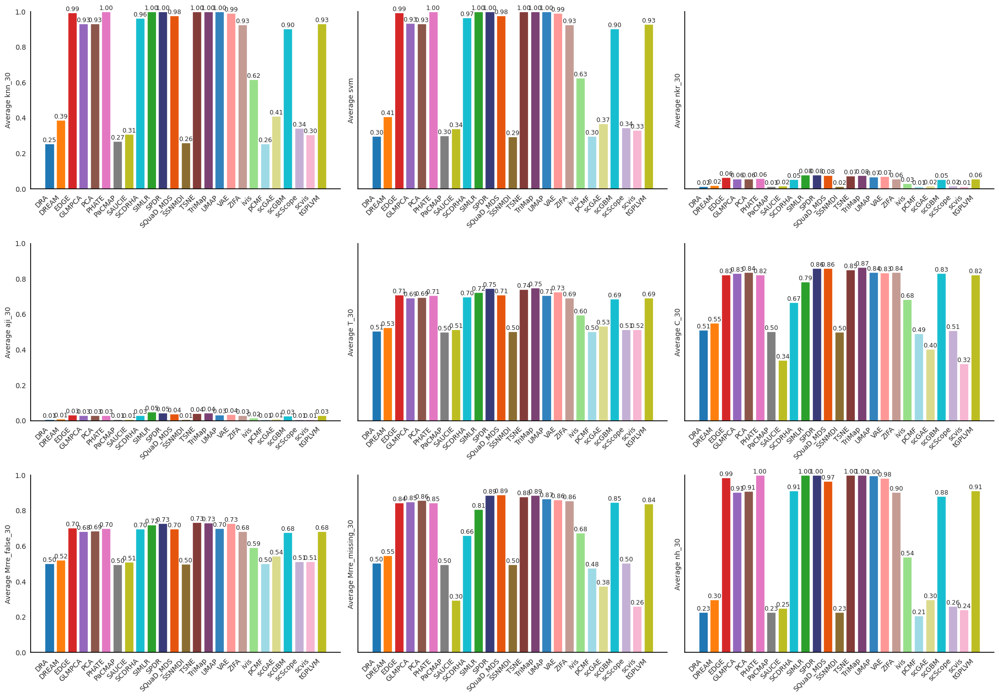

In [41]:
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.ticker import MaxNLocator
import numpy as np

# 颜色列表
colors = [
    "#1f77b4", "#ff7f0e", "#d62728", "#9467bd", "#8c564b", "#e377c2",
    "#7f7f7f", "#bcbd22", "#17becf", "#2ca02c",
    "#393b79", "#e6550d", "#8c6d31", "#843c39", "#7b4173",
    "#3182bd", "#ff9896", "#c49c94", "#98df8a", "#9edae5",
    "#dbdb8d", "#17becf", "#c5b0d5", "#f7b6d2", "#bcbd22", "#aec7e8"
]

# 指标定义
dr1_local  = ['knn_30','svm','nkr_30','aji_30']                    # -> dr1.csv
dr2_local  = ['T_30','C_30']                                      # -> dr2.csv
dr3_local  = ['Mrre_false_30','Mrre_missing_30','nh_30']          # -> dr3.csv

# 需要绘制的局部指标，按 4 + 2 + 3 的顺序排满 3×3
local_metrics = dr1_local + dr2_local + dr3_local

# 数据块（与之前一致）
fragments = ['cells','genes','celltypes','batchs','batch_strength','dropouts','des','de_strength','outs']

for fragment in fragments:
    # 创建 3×3 子图
    fig, axes = plt.subplots(3, 3, figsize=(20, 14), sharey=True)
    axes = axes.flatten()
    fig.set_facecolor("white")

    for idx, metric in enumerate(local_metrics):
        # 选择对应 CSV
        if metric in dr1_local:
            csv_path = f"/home/henu/work/result/score/synthetic/{fragment}_dr1.csv"
        elif metric in dr2_local:
            csv_path = f"/home/henu/work/result/score/synthetic/{fragment}_dr2.csv"
        elif metric in dr3_local:
            csv_path = f"/home/henu/work/result/score/synthetic/{fragment}_dr3.csv"
        else:
            continue  # 理论不会触发

        df = pd.read_csv(csv_path)

        # 过滤与命名
        df = df[df["Method"] != "ParametricUMAP200"].copy()
        df = df[df["Method"] != "ParametricUMAP50"].copy()
        df = df[df["Method"] != "SQuaD_MDS"].copy()
        df["Method"] = df["Method"].replace({"SQuaD_MDS_hybrid": "SQuaD_MDS"})

        # 指标列兜底（若列名不一致，取第二列）
        if metric not in df.columns:
            if len(df.columns) >= 2:
                metric_col = df.columns[1]
            else:
                raise ValueError(f"{csv_path} 中找不到指标列 {metric}")
        else:
            metric_col = metric

        df = df[["Method", metric_col]].copy()

        ax = axes[idx]
        ax.set_facecolor("white")
        ax.grid(False)

        # 柱图
        x = np.arange(len(df))
        bars = ax.bar(x, df[metric_col].values, color=colors[:len(df)])

        # y 轴统一 0~1（固定刻度范围）
        ax.set_ylim(0, 1.0)
        ax.yaxis.set_major_locator(MaxNLocator(nbins=6))

        # 轴标签与刻度
        ax.set_ylabel(f"Average {metric}")
        ax.set_xticks(x)
        ax.set_xticklabels(df["Method"], rotation=45, ha="right")

        # 边框样式：隐藏上/右；左/下显式并加粗
        ax.spines["top"].set_visible(False)
        ax.spines["right"].set_visible(False)
        ax.spines["left"].set_visible(True)
        ax.spines["bottom"].set_visible(True)
        ax.spines["left"].set_linewidth(1.2)
        ax.spines["bottom"].set_linewidth(1.2)
        ax.spines["left"].set_color("black")
        ax.spines["bottom"].set_color("black")

        # 柱顶数值标注
        for rect, val in zip(bars, df[metric_col].values):
            height = rect.get_height()
            ax.text(
                rect.get_x() + rect.get_width() / 2,
                height,
                f"{val:.2f}",
                ha="center",
                va="bottom",
                fontsize=9
            )

        # 可选：子图标题（如需）
        # ax.set_title(metric)

    # 若不足 9 个（理论不会），隐藏多余轴
    for k in range(len(local_metrics), 9):
        axes[k].axis("off")

    plt.tight_layout()
    out_svg = f"/home/henu/work/result/figures/50SimulateDatasets/Integration/local/{fragment}.svg"
    plt.savefig(out_svg)
    plt.show()